Imports

In [97]:
import numpy as np
import matplotlib.pyplot as plt
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Set the seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
random.seed(seed)

Provision GPU

In [98]:
device = None

if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print("GPU is available")
else:
    device = torch.device("cpu")
    print("GPU is not available, using CPU")

GPU is available


Create 3D data that are uniformly distributed over the surface of a cube.

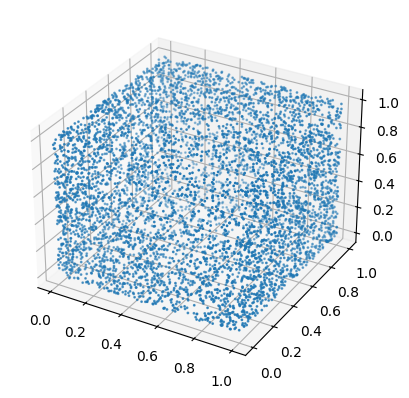

(6000, 3)


In [99]:
def generate_cube_data(n):
    data = []
    #For each face of the cube
    for i in range(6):
        face = np.random.rand(3, n)
        axis = i // 2  # 0: x, 1: y, 2: z
        face[axis, :] = (i % 2)  # 0 or 1, depending on the face
        data.append(face)
    return np.hstack(data)

n = 1000
points = generate_cube_data(n)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(*points, s=1)
plt.show()

#  Creates the data
points = points.T
data = TensorDataset(torch.tensor(points, dtype=torch.float32, device=device))
loader = DataLoader(data, batch_size=32, shuffle=True,)

print(points.shape)

Create an autoencoder (not VAE) with an MSE Objective function, with an adjustable number of nerons in the latent layer (bottleneck), and provide a probablistic interpretation of the MSE object function

In [100]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, latent_dim),
            nn.ReLU(),
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, input_dim),
            nn.Sigmoid(),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
    # To interpret the MSE Objective Function
    def encode(self, x):
        return self.encoder(x)
    
    def plot_bottleneck(self, x):
        all_outputs = []
        with torch.no_grad():
            for batch in x:
                data = batch[0]
                encoded = self.encode(data).cpu().numpy()
                all_outputs.extend(encoded)

        all_outputs = np.array(all_outputs)

        # Number of dimensions in the bottleneck layer
        num_dims = all_outputs.shape[1]

        # Plot histograms for each dimension
        fig, axs = plt.subplots(1, num_dims, figsize=(4*num_dims, 5))

        for i in range(num_dims):
            axs[i].hist(all_outputs[:, i], bins=50, alpha=0.7)
            axs[i].set_title(f'Distribution of Dimension {i+1}')
            axs[i].set_xlabel(f'Value')
            axs[i].set_ylabel(f'Frequency')

        plt.tight_layout()
        plt.show()


Train the Auto Encoder

Epoch [1/10], Loss: 0.1322
Epoch [2/10], Loss: 0.1188
Epoch [3/10], Loss: 0.0752
Epoch [4/10], Loss: 0.0666
Epoch [5/10], Loss: 0.0449
Epoch [6/10], Loss: 0.0300
Epoch [7/10], Loss: 0.0217
Epoch [8/10], Loss: 0.0121
Epoch [9/10], Loss: 0.0068
Epoch [10/10], Loss: 0.0034


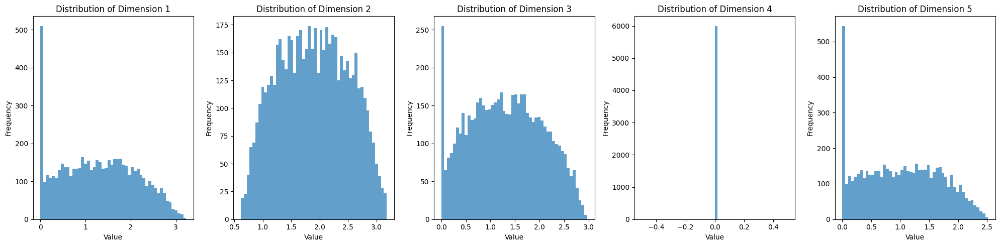

In [101]:
def train_autoencoder(latent_dim, num_epochs=10):
    model = Autoencoder(input_dim=3, latent_dim=latent_dim).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        for data, in loader:
            outputs = model(data)
            loss = criterion(outputs, data)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        # print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}")
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}")
    model.plot_bottleneck(loader)

train_autoencoder(5, 10)

The basic autoencoder is trying to compress the input into a latent space and reconstruct it, and the MSE objective function helps the network learn how to minimize the difference between input and output, treating the error probabilistically as normally distributed noise. Specifically, the MSE is equivalent to maximizing the likelihood of the data assuming that the reconstruction error follows a Gaussian distribution with zero mean and constant variance.

Include a method to control the distribution of the latent (bottleneck) variable, add iid Gaussian noise to the latent (bottleneck) variable with an adjustable (not learned) SNR (ratio of variance of variable=signal over variance of noise)

Epoch [1/20], Loss: 0.1356, MSE Loss: 0.1355, KL Loss: 0.0004
Epoch [2/20], Loss: 0.1259, MSE Loss: 0.1259, KL Loss: 0.0002
Epoch [3/20], Loss: 0.1409, MSE Loss: 0.1409, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1311, MSE Loss: 0.1311, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1438, MSE Loss: 0.1438, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1430, MSE Loss: 0.1430, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1423, MSE Loss: 0.1423, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1468, MSE Loss: 0.1468, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1392, MSE Loss: 0.1392, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1416, MSE Loss: 0.1416, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1445, MSE Loss: 0.1445, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1484, MSE Loss: 0.1484, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1521, MSE Loss: 0.1521, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1365, MSE Loss: 0.1365, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1427, MSE Loss: 0.1427, KL Loss: 0.0001
Epoch [16/20], Loss: 0.1338, MSE Loss: 0.1338, KL Loss: 0.0001
E

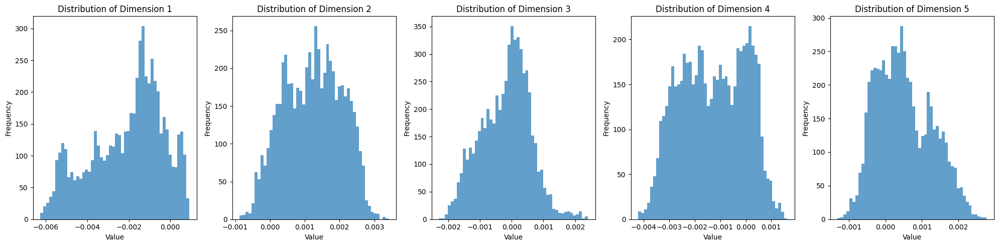

In [102]:
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim, snr=10):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(),
            nn.Linear(128, input_dim),
            nn.Sigmoid()
        )
        self.snr = snr

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std

        # Add Gaussian noise with adjustable SNR
        signal_power = torch.var(z, dim=0, unbiased=False)
        noise_power = signal_power / self.snr
        noise = torch.randn_like(z) * torch.sqrt(noise_power)
        z_noisy = z + noise

        return z_noisy

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        decoded = self.decode(z)
        return decoded, mu, logvar

    def kl_divergence(self, mu, logvar):
        return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    def plot_bottleneck(self, data_loader):
        all_outputs = []
        self.eval()  # Set the model to evaluation mode
        with torch.no_grad():
            for batch in data_loader:
                data = batch[0].to(next(self.parameters()).device)
                mu, logvar = self.encode(data)
                encoded = mu.cpu().numpy()
                all_outputs.extend(encoded)

        all_outputs = np.array(all_outputs)

        # Number of dimensions in the bottleneck layer
        num_dims = all_outputs.shape[1]

        # Plot histograms for each dimension
        fig, axs = plt.subplots(1, num_dims, figsize=(4*num_dims, 5))

        for i in range(num_dims):
            axs[i].hist(all_outputs[:, i], bins=50, alpha=0.7)
            axs[i].set_title(f'Distribution of Dimension {i+1}')
            axs[i].set_xlabel('Value')
            axs[i].set_ylabel('Frequency')

        plt.tight_layout()
        plt.show()

# Define the training function
def train_vae(model, data_loader, num_epochs=20, learning_rate=0.001, kl_weight=0.1):
    model.to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in range(num_epochs):
        for data in data_loader:
            inputs = data[0].to(device)
            outputs, mu, logvar = model(inputs)
            mse_loss = criterion(outputs, inputs)
            kl_loss = model.kl_divergence(mu, logvar)
            loss = mse_loss + kl_weight * kl_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, MSE Loss: {mse_loss.item():.4f}, KL Loss: {kl_loss.item():.4f}')
    model.plot_bottleneck(data_loader)

model = VAE(3, 5, snr=10)

train_vae(model, loader, num_epochs=20, kl_weight=0.1)


 Estimate the information in bits passing through the latent layer for your settings (see equation (2) ).

Average Reconstruction Error: 0.1396


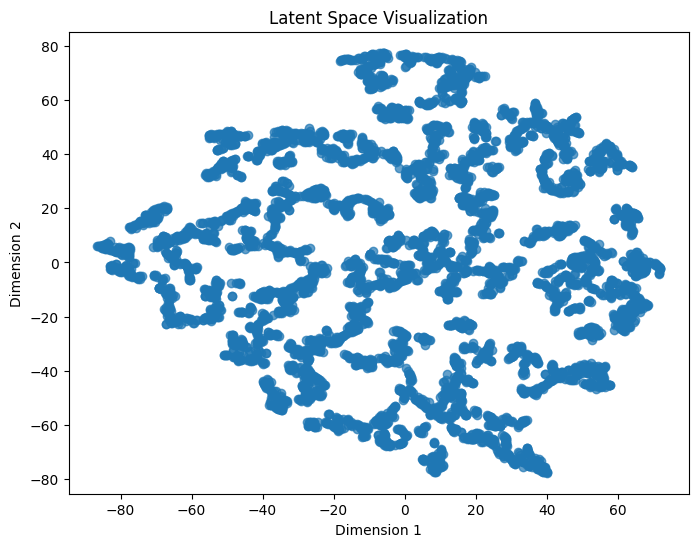

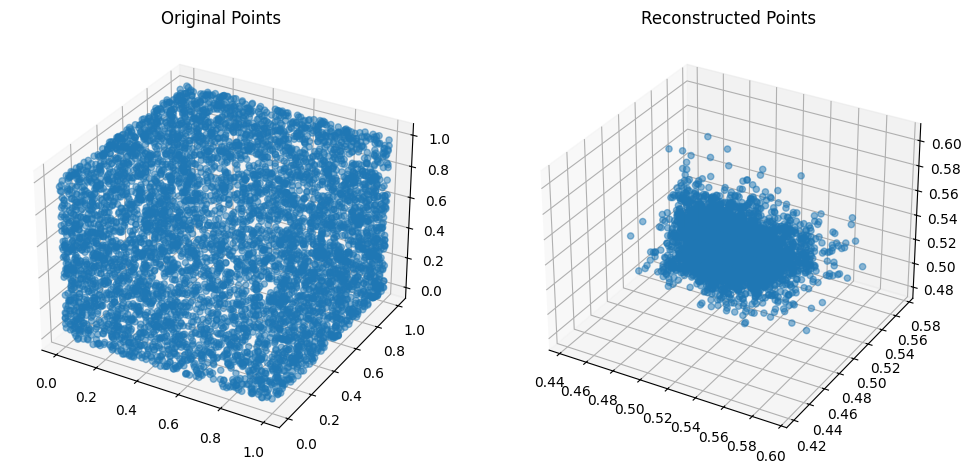

In [103]:
import torch.nn.functional as F
from sklearn.manifold import TSNE

def estimate_information(model, data_loader):
    model.eval()  # Set the model to evaluation mode
    reconstruction_errors = []
    original_data = []
    reconstructed_data = []
    latent_representations = []

    with torch.no_grad():
        for data in data_loader:
            inputs = data[0].to(next(model.parameters()).device)
            outputs, mu, logvar = model(inputs)
            reconstruction_errors.append(nn.functional.mse_loss(outputs, inputs, reduction='none').cpu().numpy())
            original_data.append(inputs.cpu().numpy())
            reconstructed_data.append(outputs.cpu().numpy())
            latent_representations.append(mu.cpu().numpy())

    reconstruction_errors = np.concatenate(reconstruction_errors)
    original_data = np.concatenate(original_data)
    reconstructed_data = np.concatenate(reconstructed_data)
    latent_representations = np.concatenate(latent_representations)

    # Compute average reconstruction error
    avg_reconstruction_error = np.mean(reconstruction_errors)
    print(f'Average Reconstruction Error: {avg_reconstruction_error:.4f}')

    # Visualize latent space using t-SNE
    if latent_representations.shape[1] > 2:
        tsne = TSNE(n_components=2)
        latent_2d = tsne.fit_transform(latent_representations)
    else:
        latent_2d = latent_representations

    plt.figure(figsize=(8, 6))
    plt.scatter(latent_2d[:, 0], latent_2d[:, 1], alpha=0.7)
    plt.title('Latent Space Visualization')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

    # 3D scatter plot of original and reconstructed data
    fig = plt.figure(figsize=(12, 6))

    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(original_data[:, 0], original_data[:, 1], original_data[:, 2], alpha=0.5)
    ax1.set_title("Original Points")

    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(reconstructed_data[:, 0], reconstructed_data[:, 1], reconstructed_data[:, 2], alpha=0.5)
    ax2.set_title("Reconstructed Points")

    plt.show()

estimate_information(model, loader)

Discuss the attributes of the reconstruction that you obtain at various SNRs
and dimensionalities of the latent vector (select a range of interesting settings).

Training VAE with latent_dim=3 and SNR=5
Epoch [1/20], Loss: 0.1347, MSE Loss: 0.1347, KL Loss: 0.0002
Epoch [2/20], Loss: 0.1473, MSE Loss: 0.1473, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1502, MSE Loss: 0.1502, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1368, MSE Loss: 0.1368, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1428, MSE Loss: 0.1428, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1458, MSE Loss: 0.1458, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1308, MSE Loss: 0.1308, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1421, MSE Loss: 0.1421, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1425, MSE Loss: 0.1425, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1463, MSE Loss: 0.1462, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1337, MSE Loss: 0.1337, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1333, MSE Loss: 0.1333, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1299, MSE Loss: 0.1299, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1491, MSE Loss: 0.1491, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1202, MSE Loss: 0.1202, KL Loss: 0.0001
Epoch [16/20], Loss: 0.

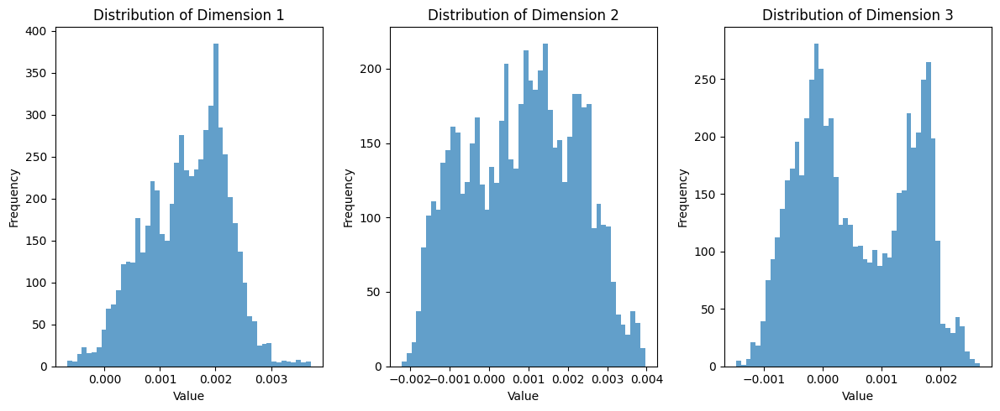

Average Reconstruction Error: 0.1394


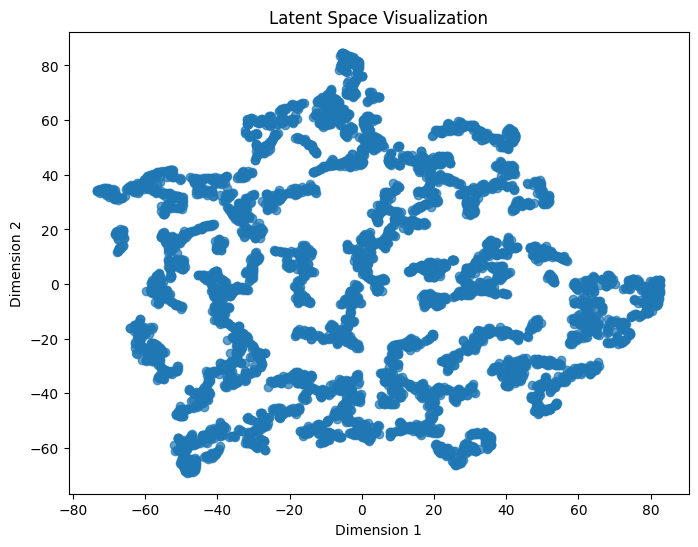

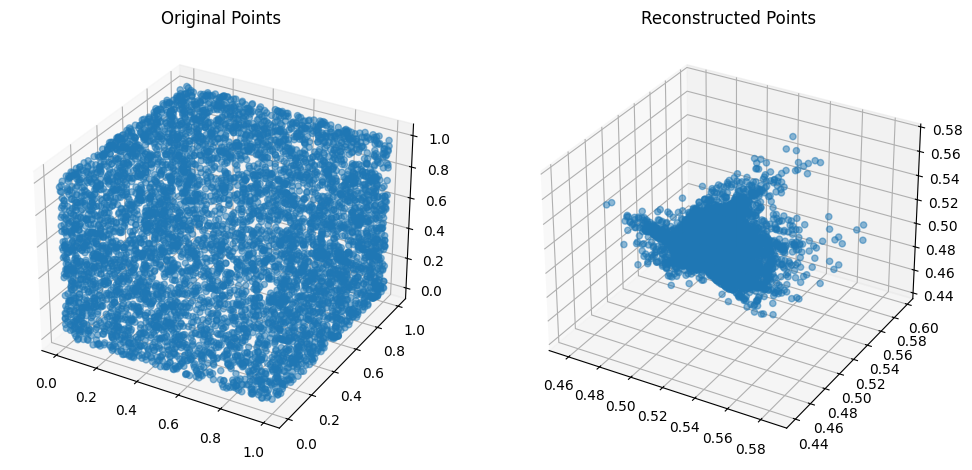

Training VAE with latent_dim=3 and SNR=10
Epoch [1/20], Loss: 0.1404, MSE Loss: 0.1403, KL Loss: 0.0002
Epoch [2/20], Loss: 0.1393, MSE Loss: 0.1393, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1360, MSE Loss: 0.1360, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1390, MSE Loss: 0.1390, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1491, MSE Loss: 0.1491, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1311, MSE Loss: 0.1311, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1406, MSE Loss: 0.1406, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1364, MSE Loss: 0.1364, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1489, MSE Loss: 0.1489, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1474, MSE Loss: 0.1474, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1334, MSE Loss: 0.1334, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1533, MSE Loss: 0.1533, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1461, MSE Loss: 0.1461, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1352, MSE Loss: 0.1352, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1327, MSE Loss: 0.1327, KL Loss: 0.0001
Epoch [16/20], Loss: 0

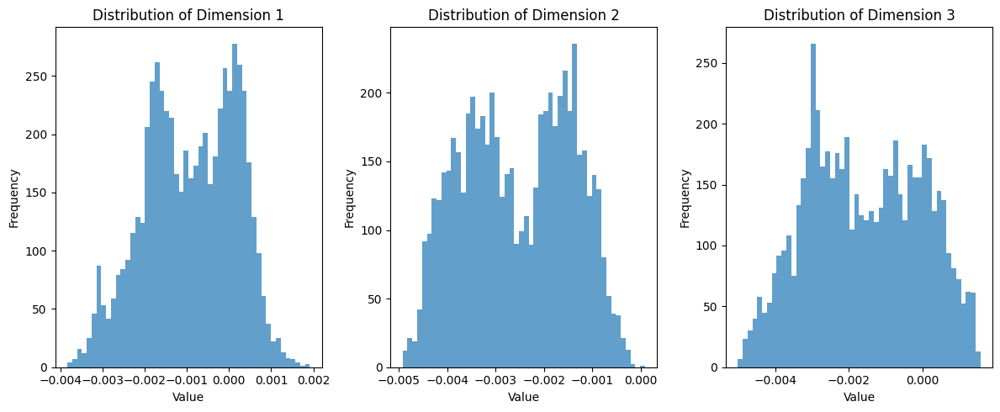

Average Reconstruction Error: 0.1393


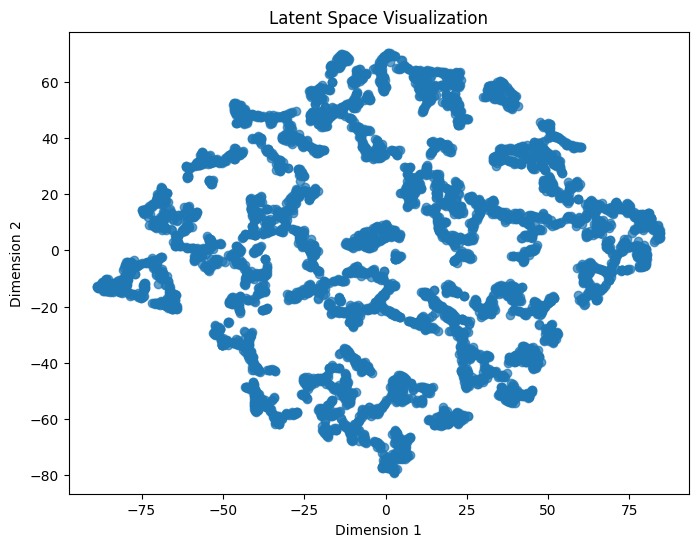

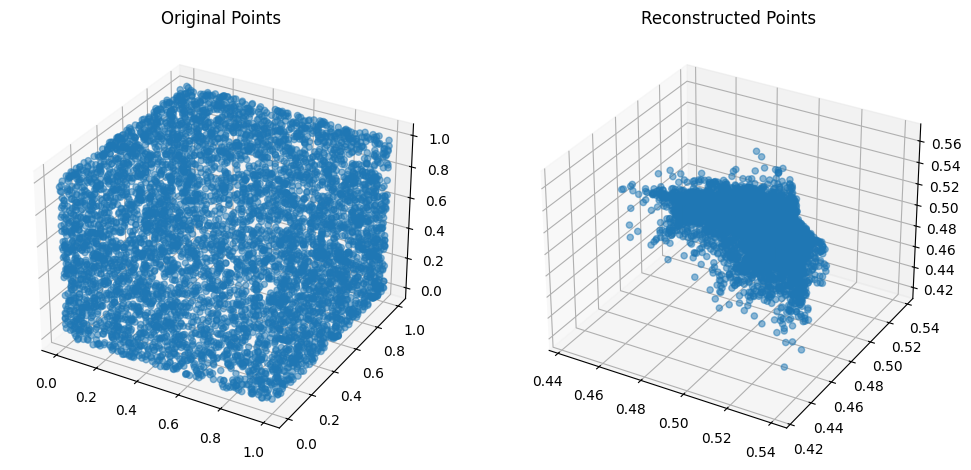

Training VAE with latent_dim=3 and SNR=15
Epoch [1/20], Loss: 0.1465, MSE Loss: 0.1465, KL Loss: 0.0002
Epoch [2/20], Loss: 0.1462, MSE Loss: 0.1462, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1153, MSE Loss: 0.1153, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1382, MSE Loss: 0.1382, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1291, MSE Loss: 0.1291, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1327, MSE Loss: 0.1327, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1368, MSE Loss: 0.1368, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1252, MSE Loss: 0.1252, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1367, MSE Loss: 0.1367, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1413, MSE Loss: 0.1413, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1322, MSE Loss: 0.1322, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1369, MSE Loss: 0.1369, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1285, MSE Loss: 0.1285, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1535, MSE Loss: 0.1535, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1309, MSE Loss: 0.1308, KL Loss: 0.0000
Epoch [16/20], Loss: 0

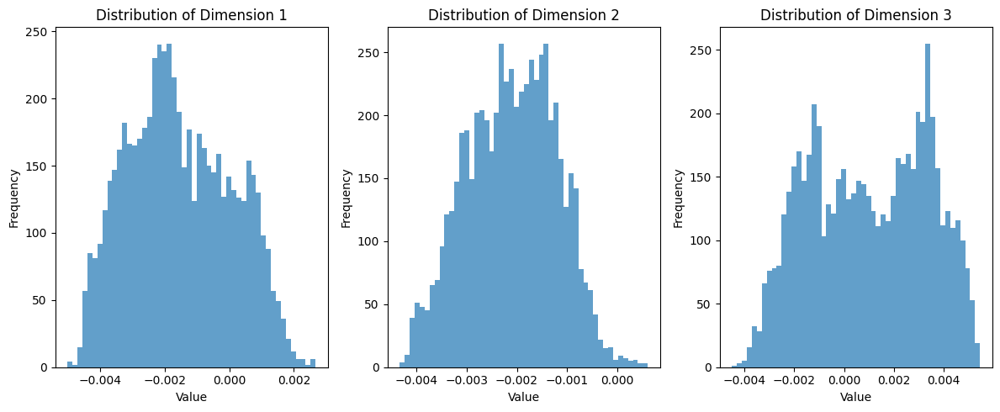

Average Reconstruction Error: 0.1395


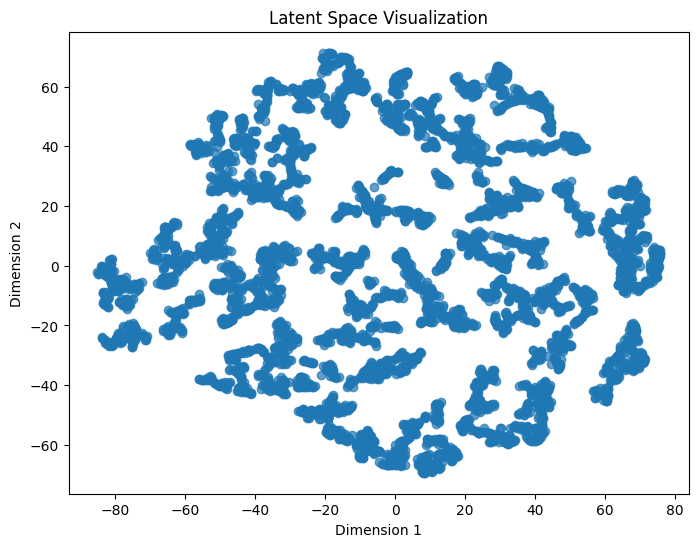

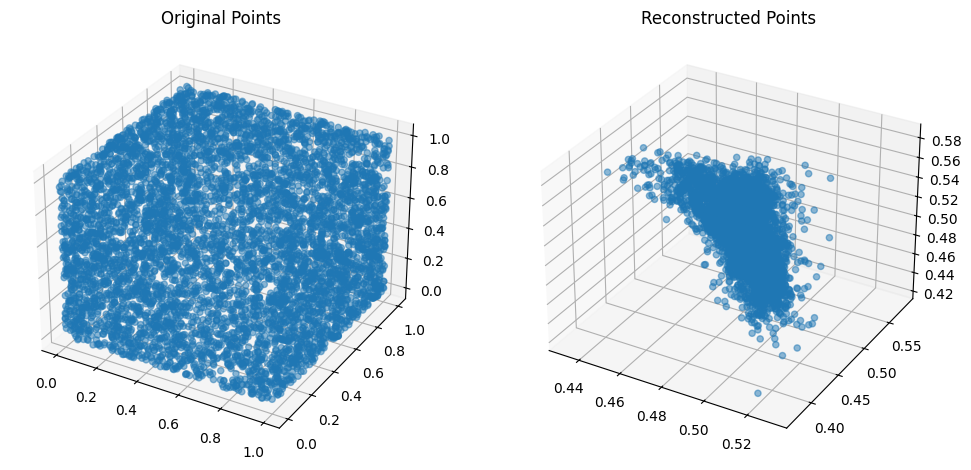

Training VAE with latent_dim=3 and SNR=20
Epoch [1/20], Loss: 0.1358, MSE Loss: 0.1358, KL Loss: 0.0002
Epoch [2/20], Loss: 0.1429, MSE Loss: 0.1428, KL Loss: 0.0002
Epoch [3/20], Loss: 0.1469, MSE Loss: 0.1469, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1479, MSE Loss: 0.1479, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1478, MSE Loss: 0.1478, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1576, MSE Loss: 0.1576, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1447, MSE Loss: 0.1447, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1399, MSE Loss: 0.1399, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1533, MSE Loss: 0.1533, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1415, MSE Loss: 0.1415, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1273, MSE Loss: 0.1273, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1499, MSE Loss: 0.1499, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1427, MSE Loss: 0.1427, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1315, MSE Loss: 0.1315, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1291, MSE Loss: 0.1291, KL Loss: 0.0001
Epoch [16/20], Loss: 0

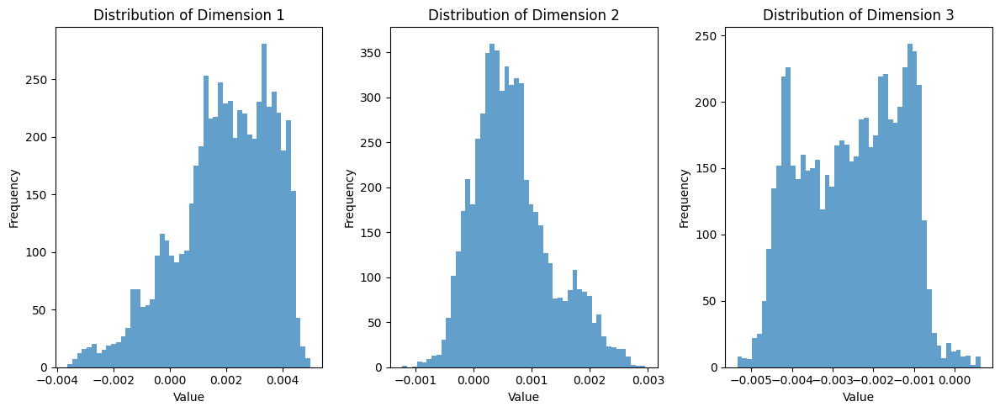

Average Reconstruction Error: 0.1396


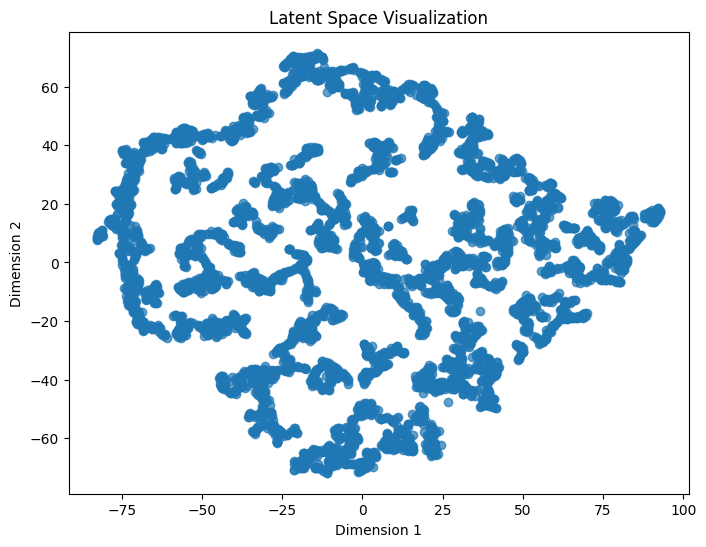

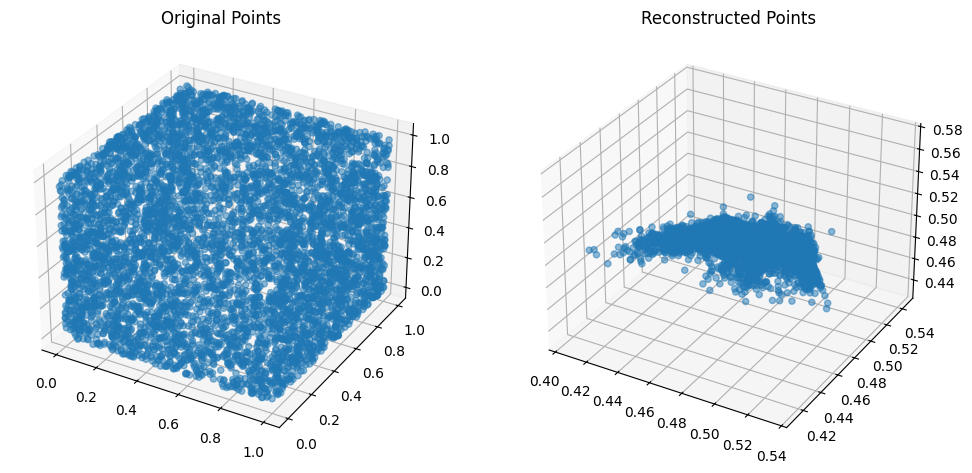

Training VAE with latent_dim=3 and SNR=30
Epoch [1/20], Loss: 0.1355, MSE Loss: 0.1355, KL Loss: 0.0002
Epoch [2/20], Loss: 0.1395, MSE Loss: 0.1395, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1325, MSE Loss: 0.1325, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1636, MSE Loss: 0.1635, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1331, MSE Loss: 0.1331, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1401, MSE Loss: 0.1400, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1306, MSE Loss: 0.1306, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1448, MSE Loss: 0.1448, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1438, MSE Loss: 0.1437, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1311, MSE Loss: 0.1311, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1445, MSE Loss: 0.1445, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1445, MSE Loss: 0.1445, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1554, MSE Loss: 0.1554, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1525, MSE Loss: 0.1525, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1531, MSE Loss: 0.1531, KL Loss: 0.0001
Epoch [16/20], Loss: 0

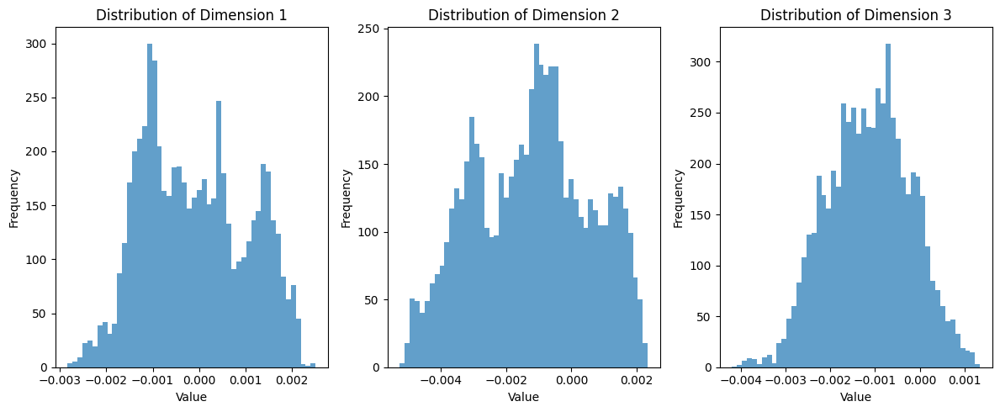

Average Reconstruction Error: 0.1398


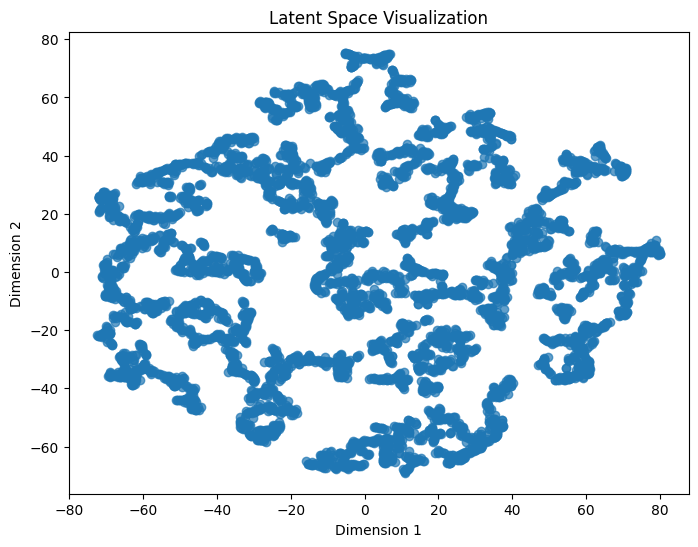

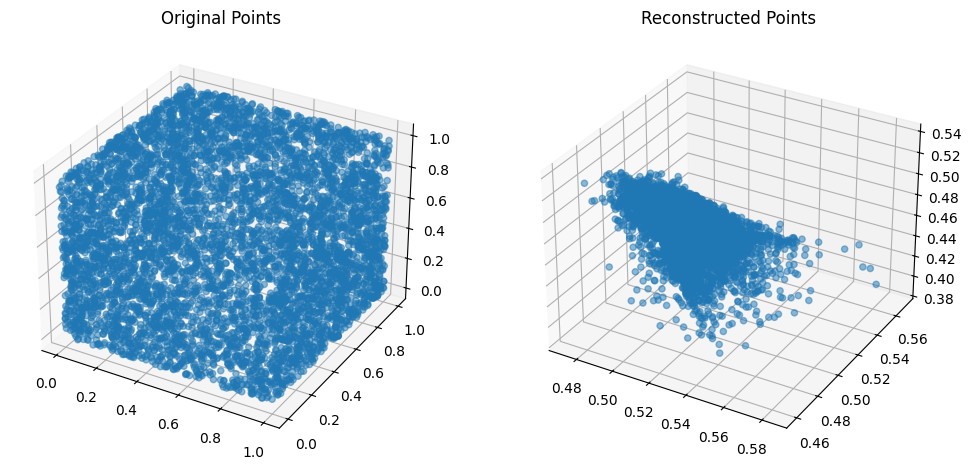

Training VAE with latent_dim=5 and SNR=5
Epoch [1/20], Loss: 0.1355, MSE Loss: 0.1354, KL Loss: 0.0004
Epoch [2/20], Loss: 0.1332, MSE Loss: 0.1332, KL Loss: 0.0002
Epoch [3/20], Loss: 0.1413, MSE Loss: 0.1412, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1455, MSE Loss: 0.1455, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1369, MSE Loss: 0.1369, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1350, MSE Loss: 0.1350, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1425, MSE Loss: 0.1425, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1422, MSE Loss: 0.1422, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1325, MSE Loss: 0.1325, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1465, MSE Loss: 0.1465, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1503, MSE Loss: 0.1503, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1400, MSE Loss: 0.1400, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1389, MSE Loss: 0.1389, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1481, MSE Loss: 0.1481, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1553, MSE Loss: 0.1553, KL Loss: 0.0001
Epoch [16/20], Loss: 0.

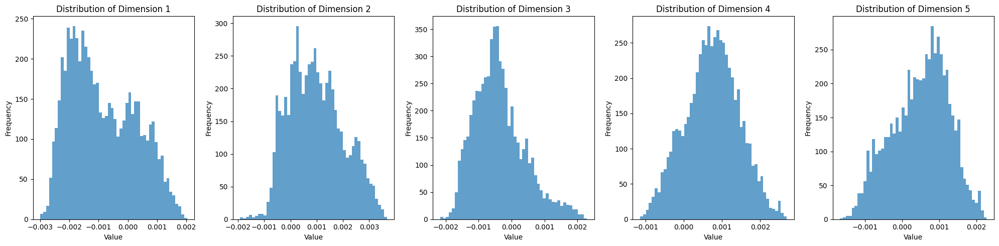

Average Reconstruction Error: 0.1397


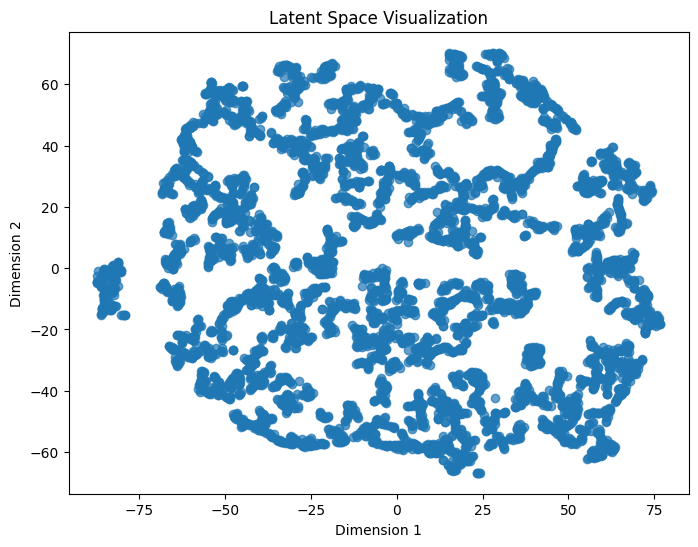

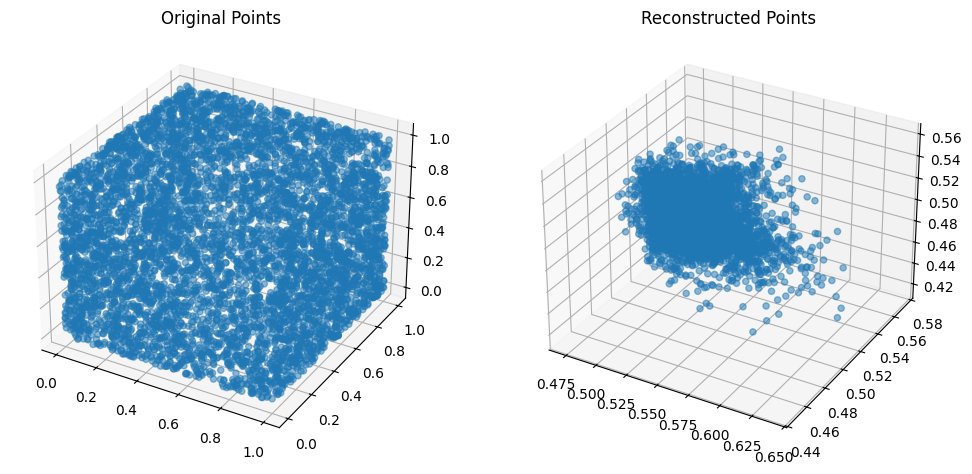

Training VAE with latent_dim=5 and SNR=10
Epoch [1/20], Loss: 0.1356, MSE Loss: 0.1355, KL Loss: 0.0005
Epoch [2/20], Loss: 0.1413, MSE Loss: 0.1413, KL Loss: 0.0002
Epoch [3/20], Loss: 0.1445, MSE Loss: 0.1445, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1301, MSE Loss: 0.1301, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1443, MSE Loss: 0.1443, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1375, MSE Loss: 0.1374, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1432, MSE Loss: 0.1432, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1352, MSE Loss: 0.1352, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1335, MSE Loss: 0.1334, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1615, MSE Loss: 0.1615, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1255, MSE Loss: 0.1255, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1505, MSE Loss: 0.1505, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1323, MSE Loss: 0.1323, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1599, MSE Loss: 0.1598, KL Loss: 0.0005
Epoch [15/20], Loss: 0.1381, MSE Loss: 0.1381, KL Loss: 0.0001
Epoch [16/20], Loss: 0

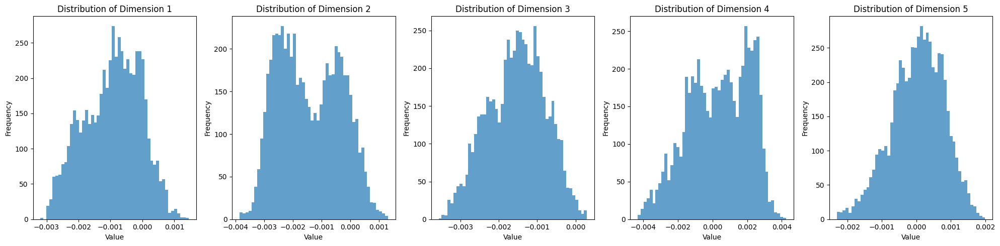

Average Reconstruction Error: 0.1395


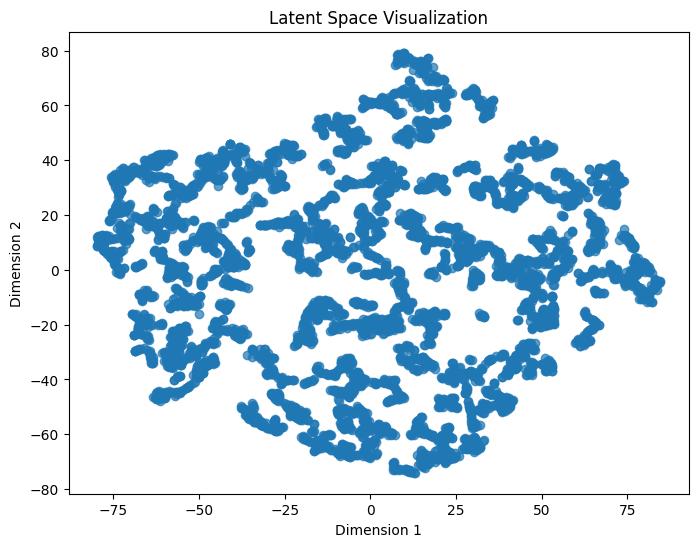

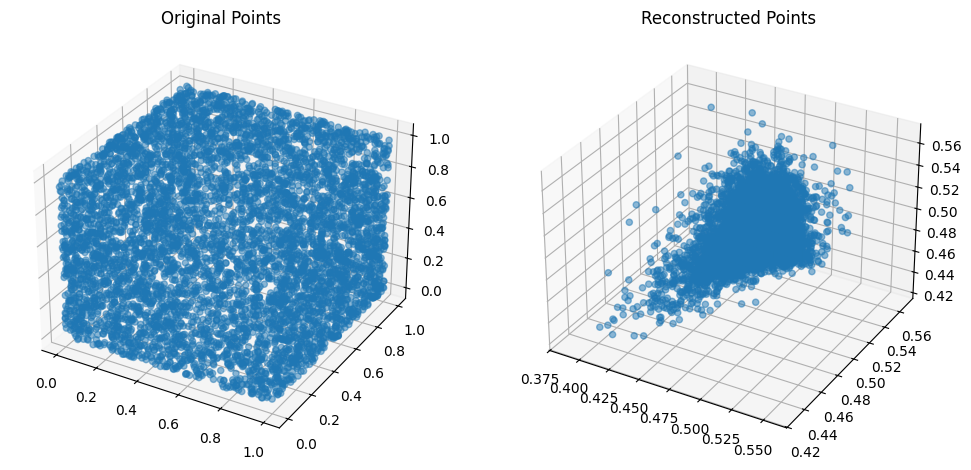

Training VAE with latent_dim=5 and SNR=15
Epoch [1/20], Loss: 0.1317, MSE Loss: 0.1317, KL Loss: 0.0003
Epoch [2/20], Loss: 0.1382, MSE Loss: 0.1381, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1246, MSE Loss: 0.1245, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1307, MSE Loss: 0.1307, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1360, MSE Loss: 0.1359, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1441, MSE Loss: 0.1440, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1440, MSE Loss: 0.1440, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1523, MSE Loss: 0.1523, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1338, MSE Loss: 0.1338, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1352, MSE Loss: 0.1352, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1402, MSE Loss: 0.1402, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1427, MSE Loss: 0.1427, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1378, MSE Loss: 0.1378, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1355, MSE Loss: 0.1355, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1266, MSE Loss: 0.1265, KL Loss: 0.0002
Epoch [16/20], Loss: 0

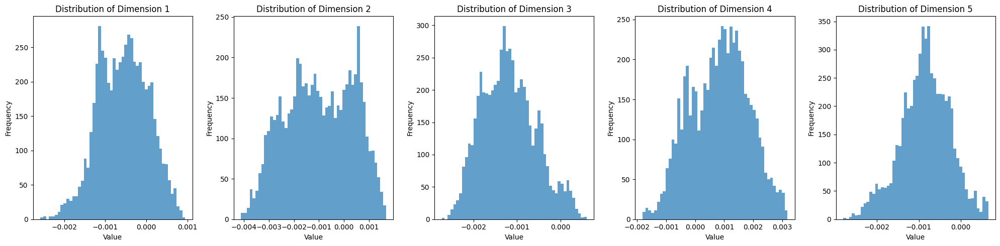

Average Reconstruction Error: 0.1393


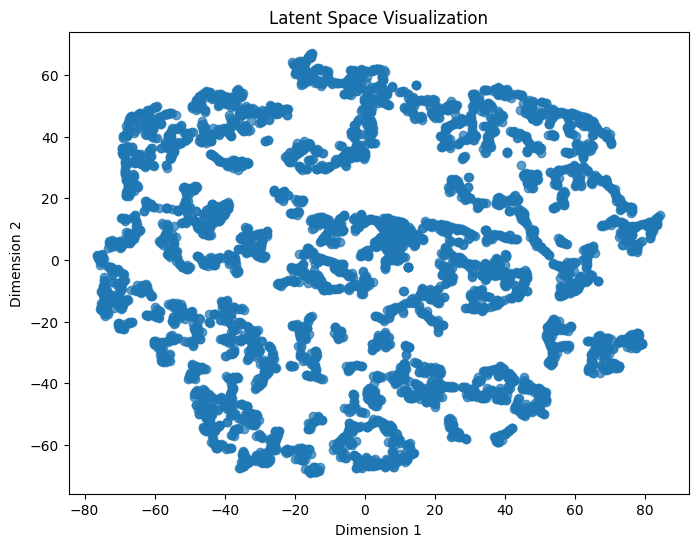

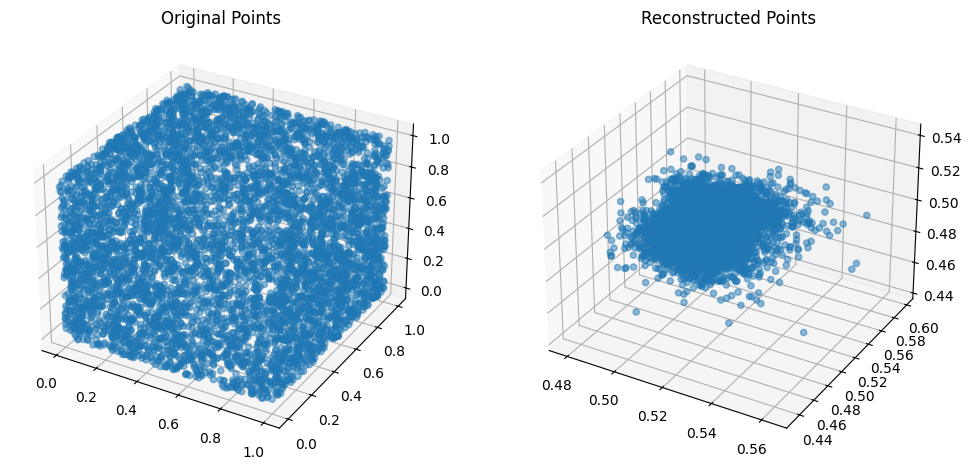

Training VAE with latent_dim=5 and SNR=20
Epoch [1/20], Loss: 0.1482, MSE Loss: 0.1482, KL Loss: 0.0003
Epoch [2/20], Loss: 0.1337, MSE Loss: 0.1337, KL Loss: 0.0001
Epoch [3/20], Loss: 0.1307, MSE Loss: 0.1307, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1492, MSE Loss: 0.1492, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1249, MSE Loss: 0.1249, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1349, MSE Loss: 0.1349, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1378, MSE Loss: 0.1378, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1447, MSE Loss: 0.1446, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1441, MSE Loss: 0.1441, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1415, MSE Loss: 0.1415, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1327, MSE Loss: 0.1327, KL Loss: 0.0003
Epoch [12/20], Loss: 0.1279, MSE Loss: 0.1279, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1290, MSE Loss: 0.1290, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1366, MSE Loss: 0.1366, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1401, MSE Loss: 0.1401, KL Loss: 0.0001
Epoch [16/20], Loss: 0

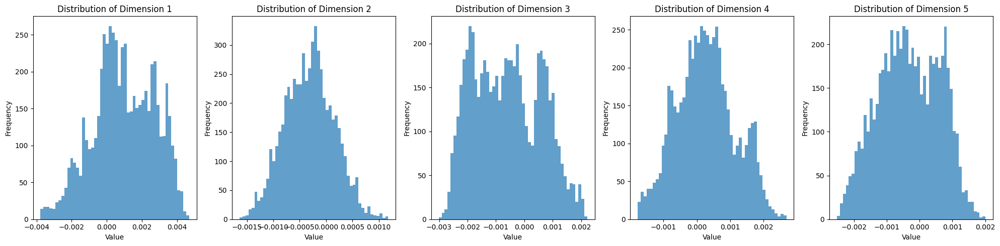

Average Reconstruction Error: 0.1395


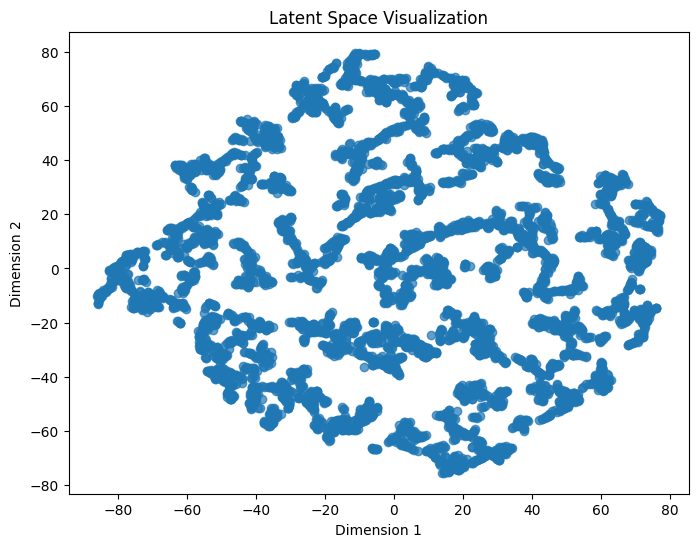

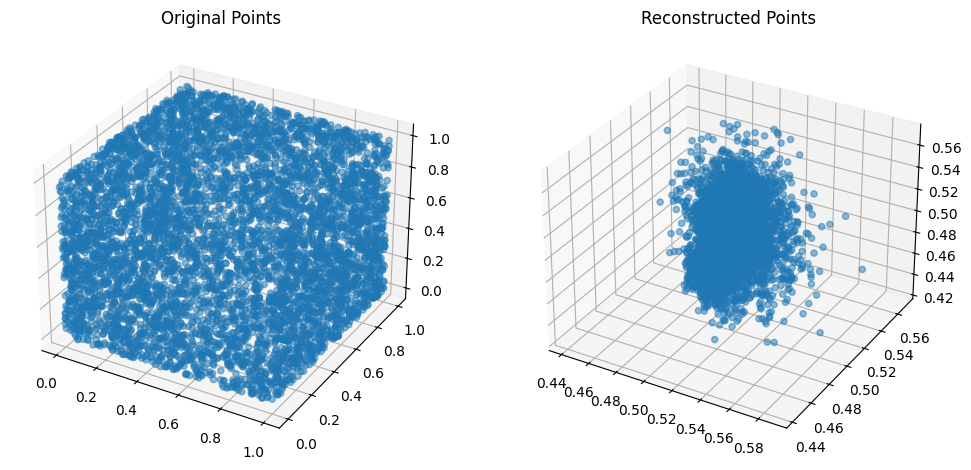

Training VAE with latent_dim=5 and SNR=30
Epoch [1/20], Loss: 0.1465, MSE Loss: 0.1465, KL Loss: 0.0003
Epoch [2/20], Loss: 0.1630, MSE Loss: 0.1630, KL Loss: 0.0002
Epoch [3/20], Loss: 0.1552, MSE Loss: 0.1552, KL Loss: 0.0001
Epoch [4/20], Loss: 0.1379, MSE Loss: 0.1378, KL Loss: 0.0001
Epoch [5/20], Loss: 0.1385, MSE Loss: 0.1385, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1473, MSE Loss: 0.1472, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1404, MSE Loss: 0.1404, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1483, MSE Loss: 0.1483, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1370, MSE Loss: 0.1370, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1308, MSE Loss: 0.1307, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1324, MSE Loss: 0.1324, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1296, MSE Loss: 0.1296, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1286, MSE Loss: 0.1286, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1466, MSE Loss: 0.1466, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1499, MSE Loss: 0.1499, KL Loss: 0.0001
Epoch [16/20], Loss: 0

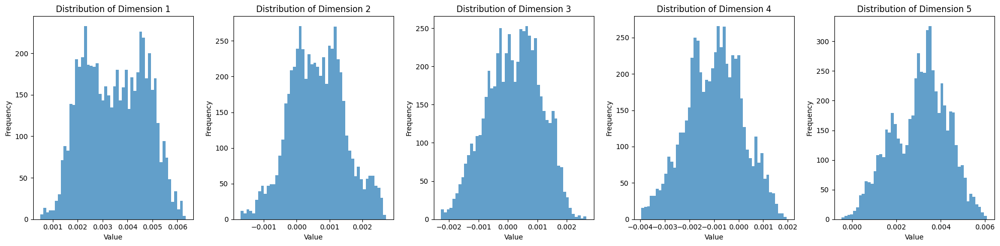

Average Reconstruction Error: 0.1397


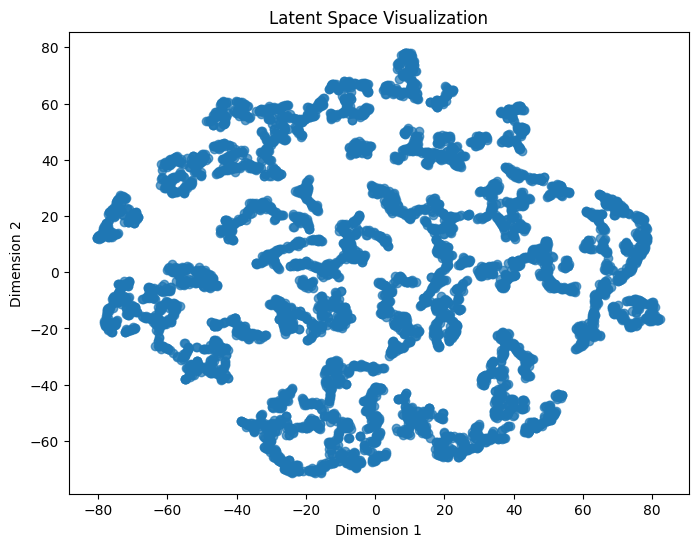

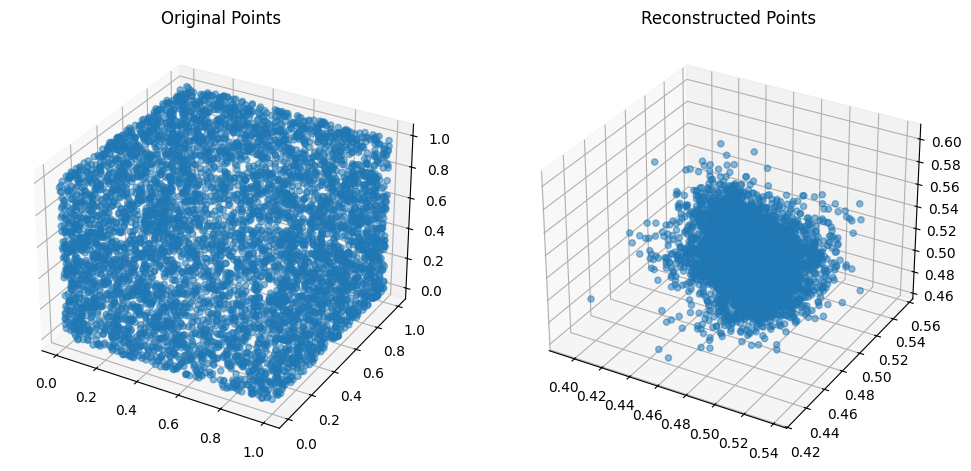

Training VAE with latent_dim=10 and SNR=5
Epoch [1/20], Loss: 0.1408, MSE Loss: 0.1408, KL Loss: 0.0006
Epoch [2/20], Loss: 0.1371, MSE Loss: 0.1371, KL Loss: 0.0003
Epoch [3/20], Loss: 0.1444, MSE Loss: 0.1444, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1461, MSE Loss: 0.1461, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1413, MSE Loss: 0.1412, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1435, MSE Loss: 0.1435, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1582, MSE Loss: 0.1582, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1321, MSE Loss: 0.1321, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1349, MSE Loss: 0.1349, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1333, MSE Loss: 0.1333, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1436, MSE Loss: 0.1436, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1237, MSE Loss: 0.1237, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1357, MSE Loss: 0.1356, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1455, MSE Loss: 0.1454, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1259, MSE Loss: 0.1259, KL Loss: 0.0001
Epoch [16/20], Loss: 0

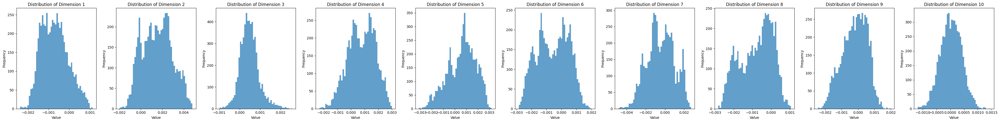

Average Reconstruction Error: 0.1396


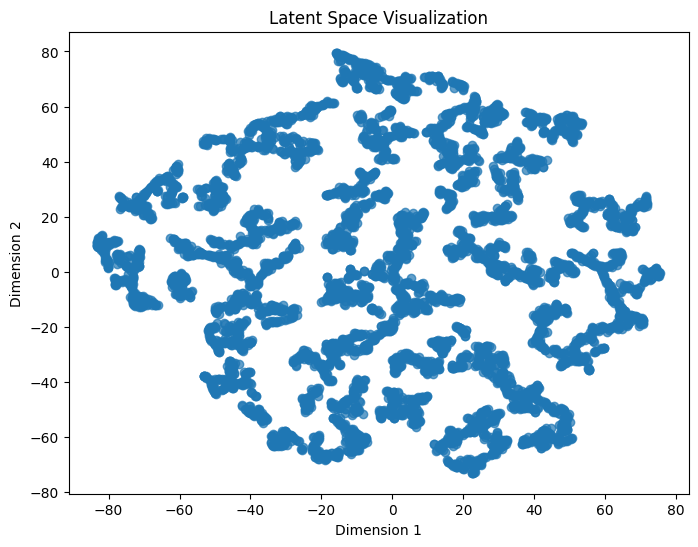

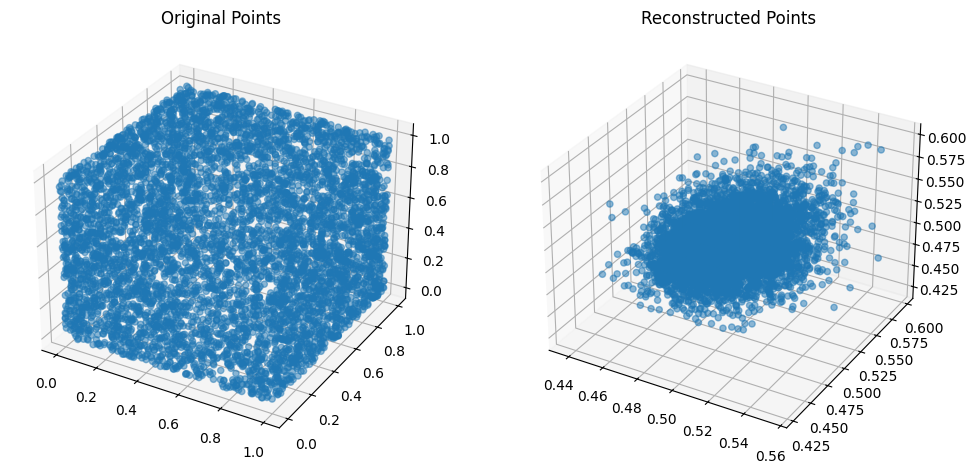

Training VAE with latent_dim=10 and SNR=10
Epoch [1/20], Loss: 0.1443, MSE Loss: 0.1443, KL Loss: 0.0007
Epoch [2/20], Loss: 0.1461, MSE Loss: 0.1461, KL Loss: 0.0003
Epoch [3/20], Loss: 0.1576, MSE Loss: 0.1576, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1524, MSE Loss: 0.1524, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1638, MSE Loss: 0.1638, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1401, MSE Loss: 0.1401, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1444, MSE Loss: 0.1444, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1440, MSE Loss: 0.1440, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1462, MSE Loss: 0.1461, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1552, MSE Loss: 0.1552, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1326, MSE Loss: 0.1326, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1402, MSE Loss: 0.1402, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1405, MSE Loss: 0.1405, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1343, MSE Loss: 0.1343, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1268, MSE Loss: 0.1267, KL Loss: 0.0001
Epoch [16/20], Loss: 

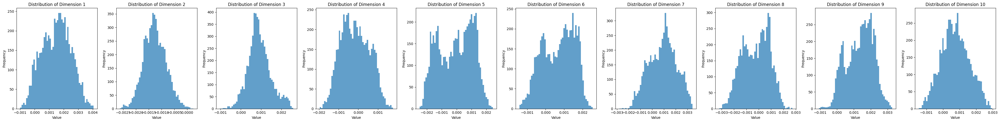

Average Reconstruction Error: 0.1396


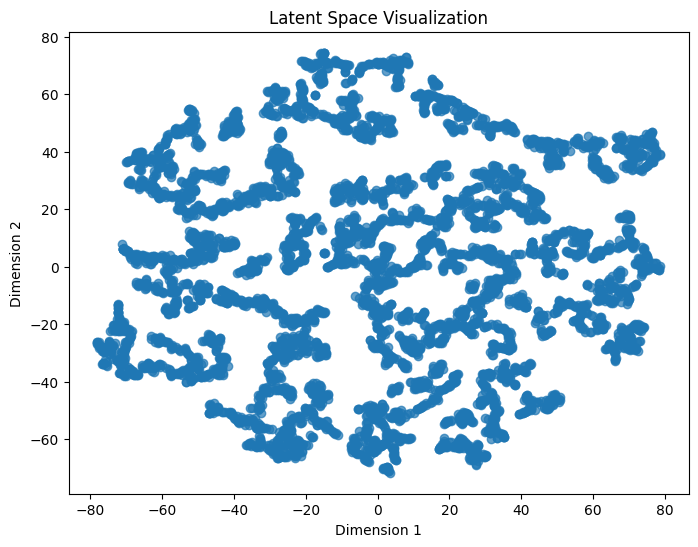

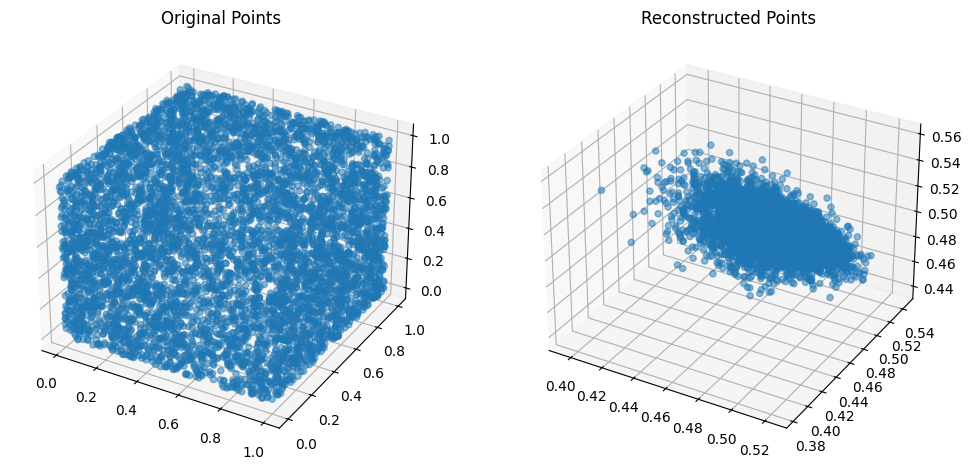

Training VAE with latent_dim=10 and SNR=15
Epoch [1/20], Loss: 0.1341, MSE Loss: 0.1340, KL Loss: 0.0009
Epoch [2/20], Loss: 0.1332, MSE Loss: 0.1331, KL Loss: 0.0003
Epoch [3/20], Loss: 0.1397, MSE Loss: 0.1397, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1345, MSE Loss: 0.1345, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1397, MSE Loss: 0.1397, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1172, MSE Loss: 0.1172, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1290, MSE Loss: 0.1290, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1318, MSE Loss: 0.1318, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1421, MSE Loss: 0.1421, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1294, MSE Loss: 0.1294, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1436, MSE Loss: 0.1436, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1203, MSE Loss: 0.1203, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1271, MSE Loss: 0.1271, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1490, MSE Loss: 0.1489, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1436, MSE Loss: 0.1436, KL Loss: 0.0001
Epoch [16/20], Loss: 

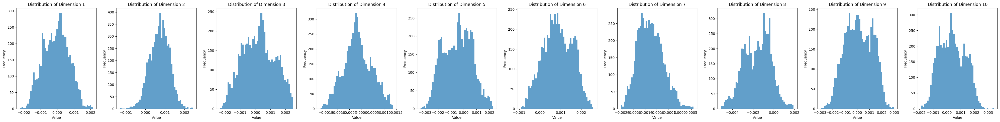

Average Reconstruction Error: 0.1395


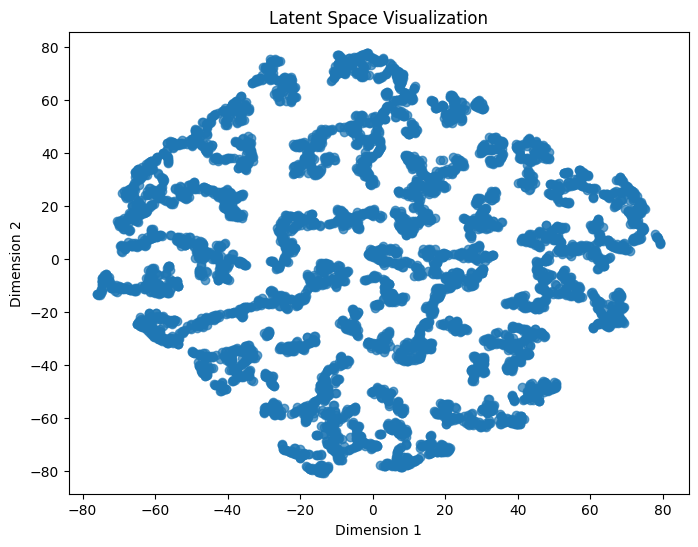

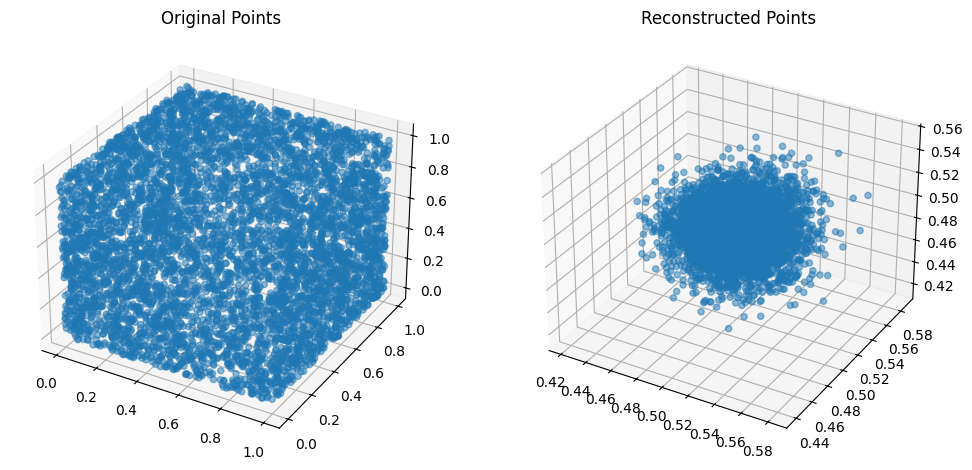

Training VAE with latent_dim=10 and SNR=20
Epoch [1/20], Loss: 0.1464, MSE Loss: 0.1463, KL Loss: 0.0005
Epoch [2/20], Loss: 0.1414, MSE Loss: 0.1414, KL Loss: 0.0003
Epoch [3/20], Loss: 0.1340, MSE Loss: 0.1340, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1383, MSE Loss: 0.1382, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1513, MSE Loss: 0.1513, KL Loss: 0.0001
Epoch [6/20], Loss: 0.1344, MSE Loss: 0.1344, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1446, MSE Loss: 0.1446, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1306, MSE Loss: 0.1306, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1549, MSE Loss: 0.1549, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1464, MSE Loss: 0.1463, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1278, MSE Loss: 0.1278, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1389, MSE Loss: 0.1389, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1259, MSE Loss: 0.1259, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1408, MSE Loss: 0.1408, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1338, MSE Loss: 0.1338, KL Loss: 0.0001
Epoch [16/20], Loss: 

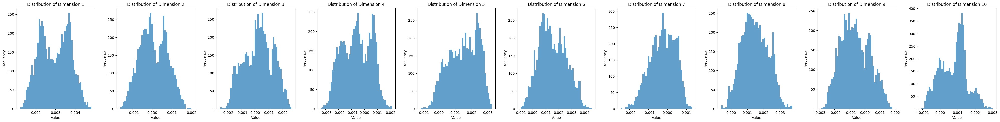

Average Reconstruction Error: 0.1393


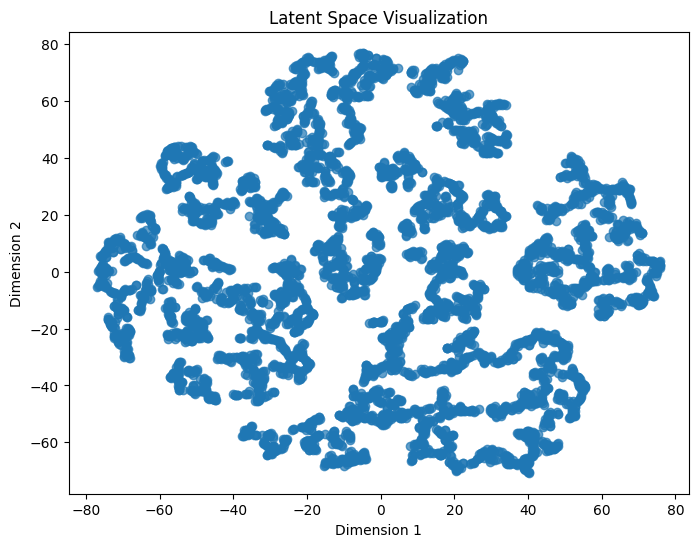

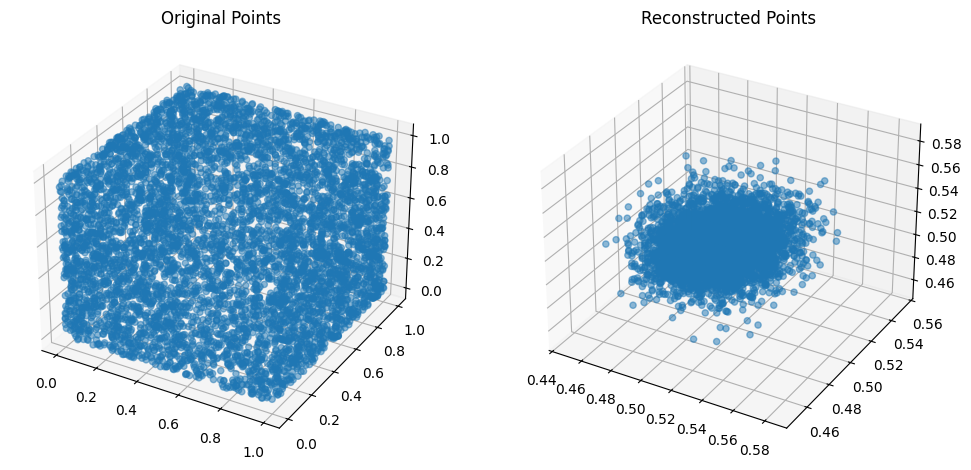

Training VAE with latent_dim=10 and SNR=30
Epoch [1/20], Loss: 0.1405, MSE Loss: 0.1405, KL Loss: 0.0007
Epoch [2/20], Loss: 0.1413, MSE Loss: 0.1413, KL Loss: 0.0003
Epoch [3/20], Loss: 0.1381, MSE Loss: 0.1380, KL Loss: 0.0002
Epoch [4/20], Loss: 0.1538, MSE Loss: 0.1537, KL Loss: 0.0002
Epoch [5/20], Loss: 0.1240, MSE Loss: 0.1239, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1351, MSE Loss: 0.1351, KL Loss: 0.0001
Epoch [7/20], Loss: 0.1407, MSE Loss: 0.1407, KL Loss: 0.0001
Epoch [8/20], Loss: 0.1486, MSE Loss: 0.1486, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1426, MSE Loss: 0.1426, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1521, MSE Loss: 0.1520, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1527, MSE Loss: 0.1527, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1370, MSE Loss: 0.1370, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1571, MSE Loss: 0.1571, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1466, MSE Loss: 0.1465, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1448, MSE Loss: 0.1448, KL Loss: 0.0001
Epoch [16/20], Loss: 

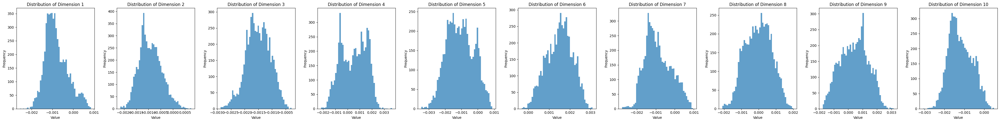

Average Reconstruction Error: 0.1392


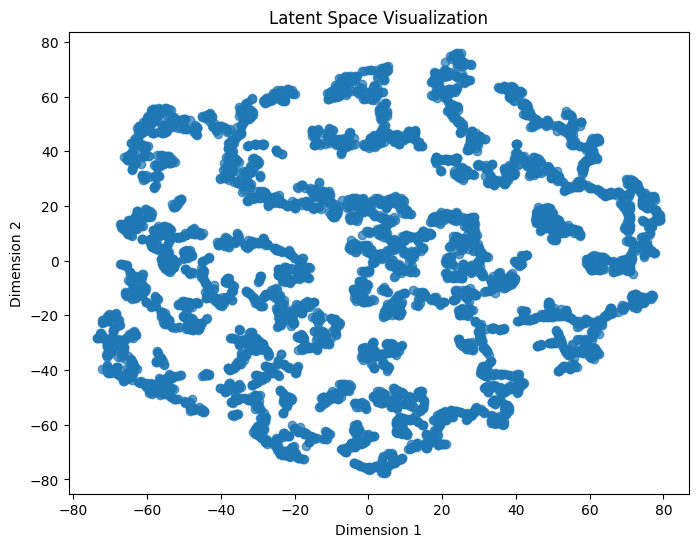

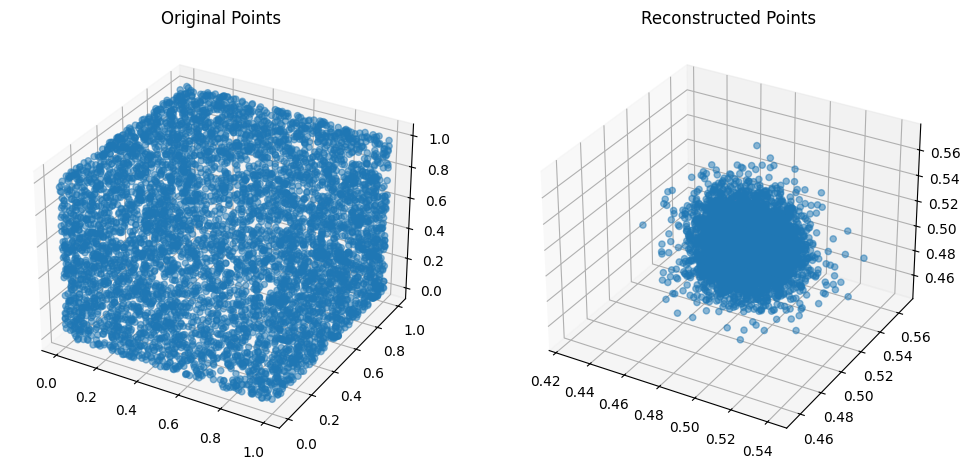

Training VAE with latent_dim=20 and SNR=5
Epoch [1/20], Loss: 0.1341, MSE Loss: 0.1340, KL Loss: 0.0015
Epoch [2/20], Loss: 0.1264, MSE Loss: 0.1263, KL Loss: 0.0007
Epoch [3/20], Loss: 0.1386, MSE Loss: 0.1386, KL Loss: 0.0005
Epoch [4/20], Loss: 0.1364, MSE Loss: 0.1364, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1463, MSE Loss: 0.1463, KL Loss: 0.0003
Epoch [6/20], Loss: 0.1516, MSE Loss: 0.1515, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1335, MSE Loss: 0.1334, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1286, MSE Loss: 0.1286, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1380, MSE Loss: 0.1380, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1393, MSE Loss: 0.1393, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1388, MSE Loss: 0.1388, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1415, MSE Loss: 0.1414, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1433, MSE Loss: 0.1433, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1322, MSE Loss: 0.1322, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1331, MSE Loss: 0.1331, KL Loss: 0.0001
Epoch [16/20], Loss: 0

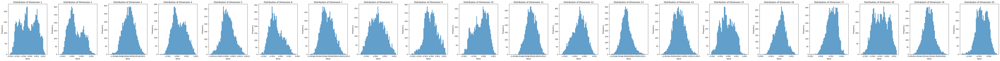

Average Reconstruction Error: 0.1394


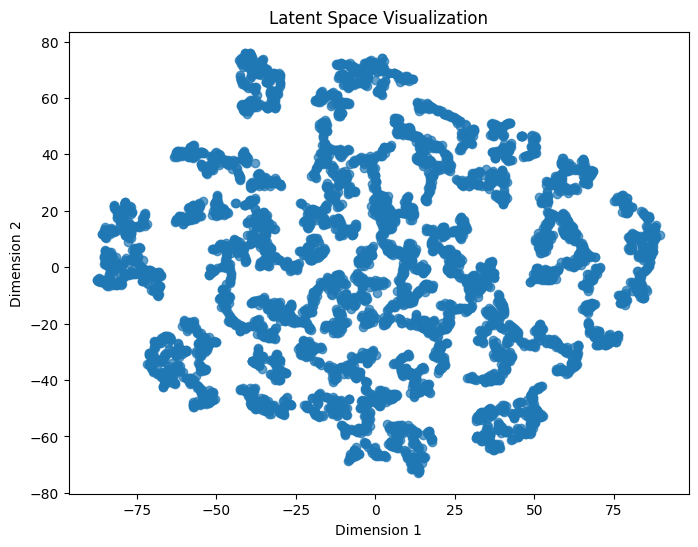

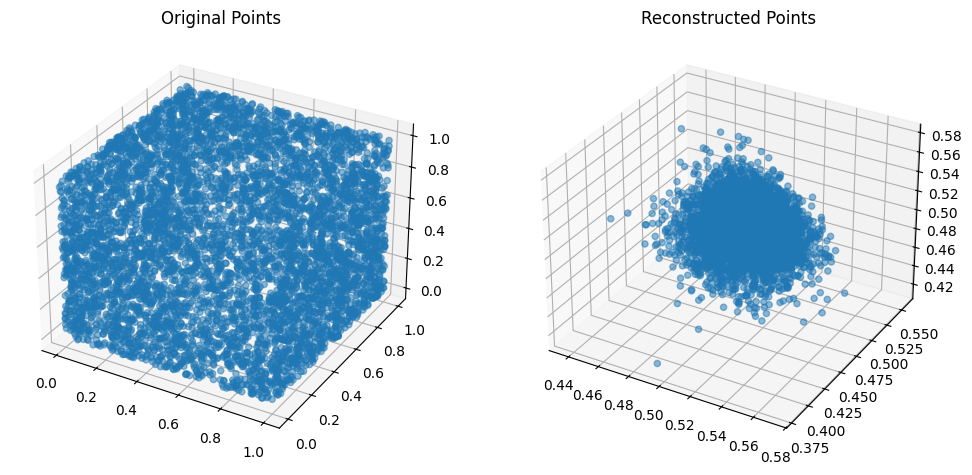

Training VAE with latent_dim=20 and SNR=10
Epoch [1/20], Loss: 0.1282, MSE Loss: 0.1281, KL Loss: 0.0012
Epoch [2/20], Loss: 0.1520, MSE Loss: 0.1519, KL Loss: 0.0006
Epoch [3/20], Loss: 0.1558, MSE Loss: 0.1558, KL Loss: 0.0003
Epoch [4/20], Loss: 0.1458, MSE Loss: 0.1457, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1443, MSE Loss: 0.1442, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1402, MSE Loss: 0.1402, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1336, MSE Loss: 0.1336, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1377, MSE Loss: 0.1377, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1387, MSE Loss: 0.1387, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1336, MSE Loss: 0.1336, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1398, MSE Loss: 0.1398, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1352, MSE Loss: 0.1352, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1322, MSE Loss: 0.1322, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1387, MSE Loss: 0.1387, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1448, MSE Loss: 0.1448, KL Loss: 0.0001
Epoch [16/20], Loss: 

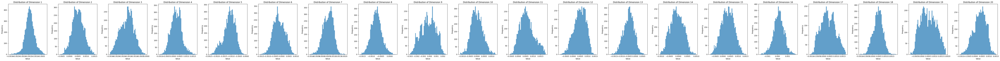

Average Reconstruction Error: 0.1392


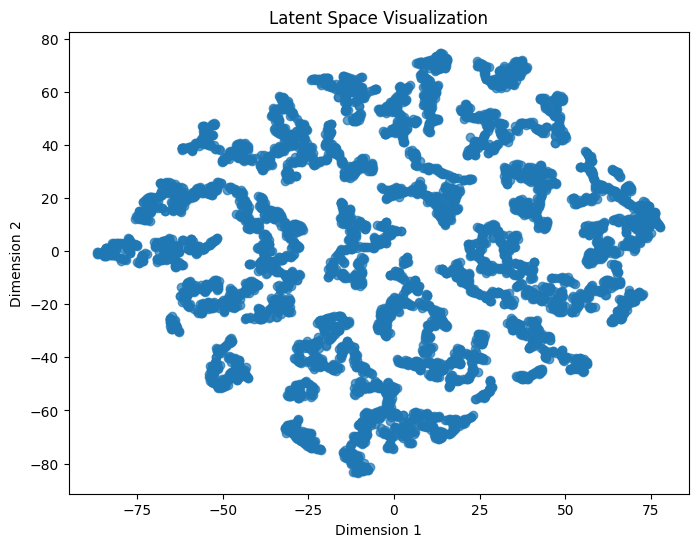

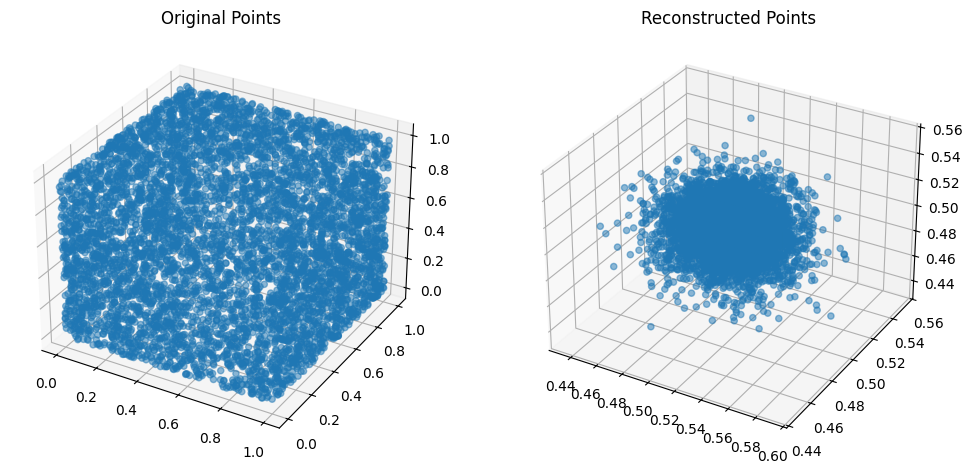

Training VAE with latent_dim=20 and SNR=15
Epoch [1/20], Loss: 0.1321, MSE Loss: 0.1319, KL Loss: 0.0012
Epoch [2/20], Loss: 0.1532, MSE Loss: 0.1531, KL Loss: 0.0006
Epoch [3/20], Loss: 0.1206, MSE Loss: 0.1206, KL Loss: 0.0004
Epoch [4/20], Loss: 0.1421, MSE Loss: 0.1421, KL Loss: 0.0004
Epoch [5/20], Loss: 0.1426, MSE Loss: 0.1426, KL Loss: 0.0003
Epoch [6/20], Loss: 0.1329, MSE Loss: 0.1329, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1218, MSE Loss: 0.1218, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1400, MSE Loss: 0.1400, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1501, MSE Loss: 0.1501, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1465, MSE Loss: 0.1465, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1232, MSE Loss: 0.1232, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1404, MSE Loss: 0.1404, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1453, MSE Loss: 0.1453, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1356, MSE Loss: 0.1356, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1469, MSE Loss: 0.1469, KL Loss: 0.0001
Epoch [16/20], Loss: 

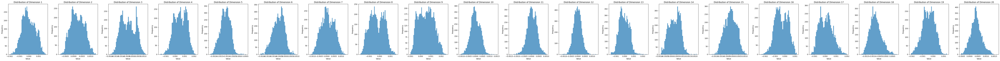

Average Reconstruction Error: 0.1396


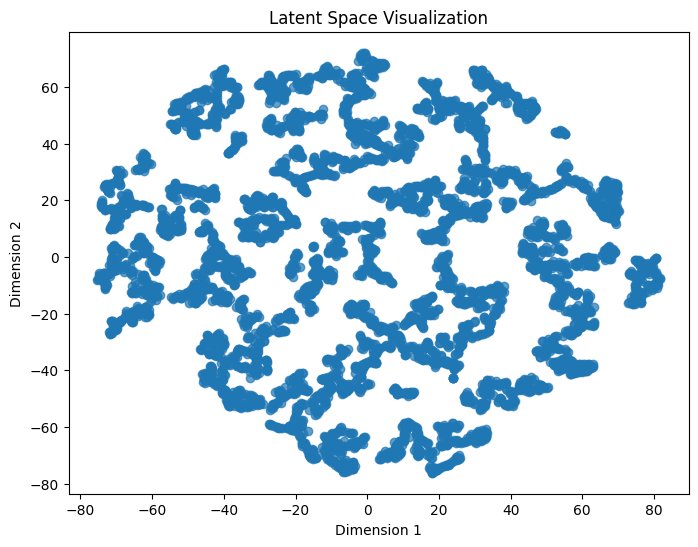

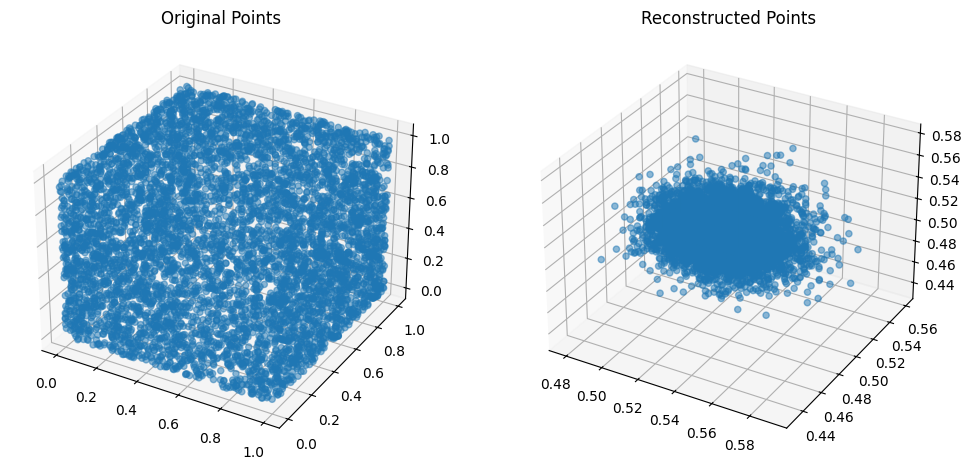

Training VAE with latent_dim=20 and SNR=20
Epoch [1/20], Loss: 0.1471, MSE Loss: 0.1469, KL Loss: 0.0015
Epoch [2/20], Loss: 0.1367, MSE Loss: 0.1366, KL Loss: 0.0008
Epoch [3/20], Loss: 0.1301, MSE Loss: 0.1301, KL Loss: 0.0004
Epoch [4/20], Loss: 0.1360, MSE Loss: 0.1360, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1370, MSE Loss: 0.1369, KL Loss: 0.0003
Epoch [6/20], Loss: 0.1371, MSE Loss: 0.1371, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1358, MSE Loss: 0.1358, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1413, MSE Loss: 0.1413, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1262, MSE Loss: 0.1262, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1393, MSE Loss: 0.1393, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1511, MSE Loss: 0.1511, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1404, MSE Loss: 0.1404, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1313, MSE Loss: 0.1313, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1532, MSE Loss: 0.1532, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1441, MSE Loss: 0.1441, KL Loss: 0.0001
Epoch [16/20], Loss: 

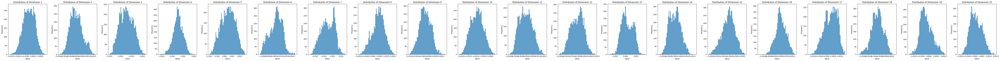

Average Reconstruction Error: 0.1392


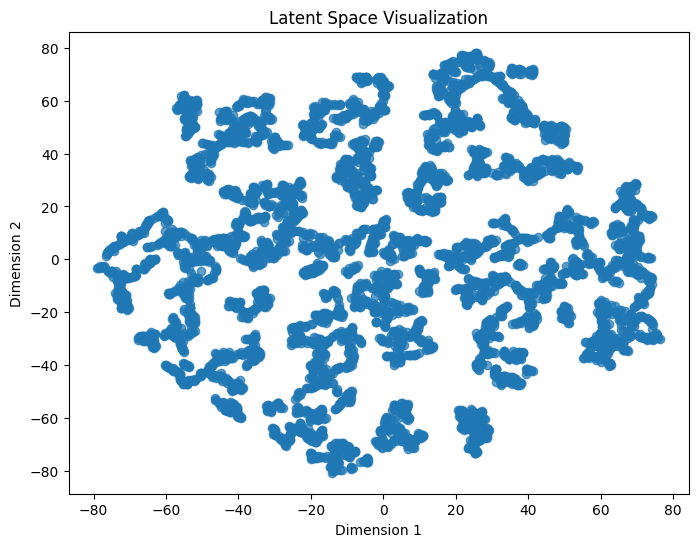

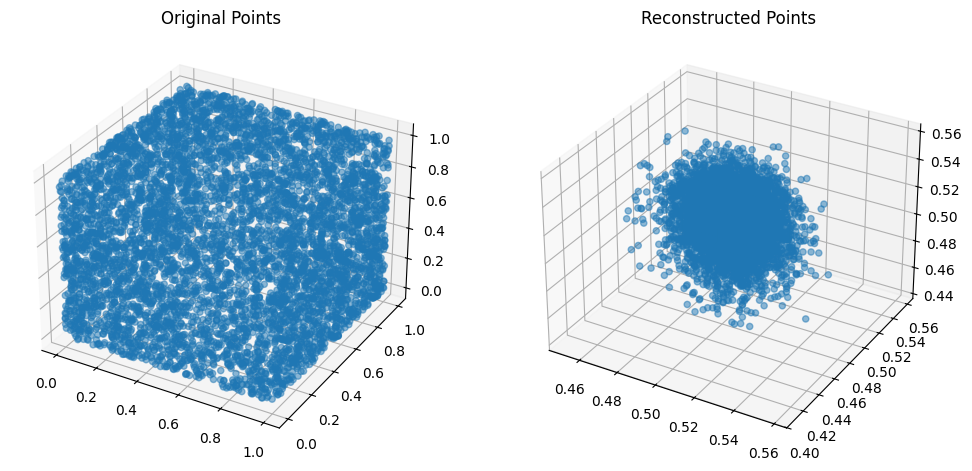

Training VAE with latent_dim=20 and SNR=30
Epoch [1/20], Loss: 0.1619, MSE Loss: 0.1618, KL Loss: 0.0011
Epoch [2/20], Loss: 0.1398, MSE Loss: 0.1397, KL Loss: 0.0006
Epoch [3/20], Loss: 0.1495, MSE Loss: 0.1494, KL Loss: 0.0004
Epoch [4/20], Loss: 0.1297, MSE Loss: 0.1297, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1429, MSE Loss: 0.1428, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1428, MSE Loss: 0.1428, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1466, MSE Loss: 0.1466, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1277, MSE Loss: 0.1277, KL Loss: 0.0002
Epoch [9/20], Loss: 0.1282, MSE Loss: 0.1282, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1324, MSE Loss: 0.1324, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1398, MSE Loss: 0.1398, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1424, MSE Loss: 0.1424, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1359, MSE Loss: 0.1359, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1362, MSE Loss: 0.1362, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1353, MSE Loss: 0.1353, KL Loss: 0.0001
Epoch [16/20], Loss: 

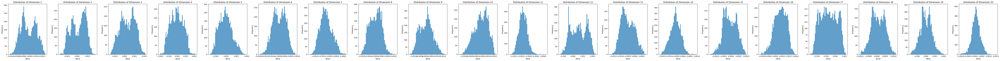

Average Reconstruction Error: 0.1392


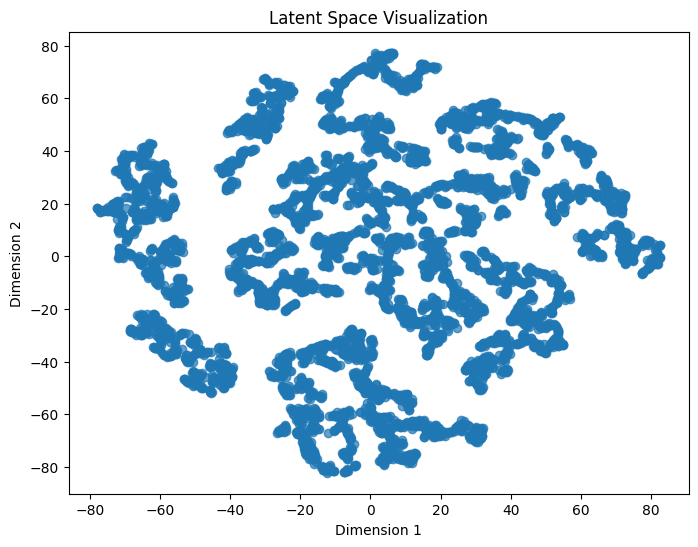

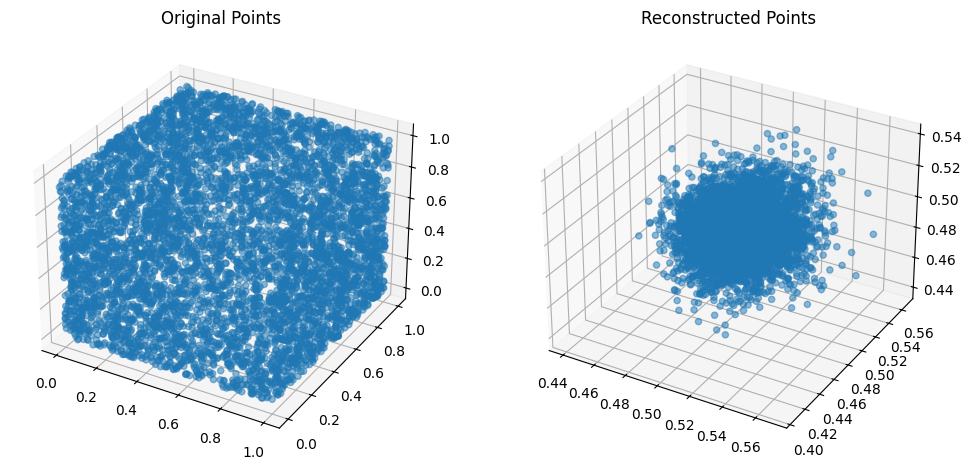

Training VAE with latent_dim=50 and SNR=5
Epoch [1/20], Loss: 0.1230, MSE Loss: 0.1227, KL Loss: 0.0029
Epoch [2/20], Loss: 0.1399, MSE Loss: 0.1398, KL Loss: 0.0011
Epoch [3/20], Loss: 0.1347, MSE Loss: 0.1346, KL Loss: 0.0007
Epoch [4/20], Loss: 0.1437, MSE Loss: 0.1436, KL Loss: 0.0005
Epoch [5/20], Loss: 0.1410, MSE Loss: 0.1409, KL Loss: 0.0004
Epoch [6/20], Loss: 0.1356, MSE Loss: 0.1356, KL Loss: 0.0003
Epoch [7/20], Loss: 0.1303, MSE Loss: 0.1303, KL Loss: 0.0003
Epoch [8/20], Loss: 0.1242, MSE Loss: 0.1241, KL Loss: 0.0003
Epoch [9/20], Loss: 0.1193, MSE Loss: 0.1193, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1485, MSE Loss: 0.1485, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1408, MSE Loss: 0.1408, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1437, MSE Loss: 0.1436, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1546, MSE Loss: 0.1546, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1283, MSE Loss: 0.1283, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1358, MSE Loss: 0.1358, KL Loss: 0.0001
Epoch [16/20], Loss: 0

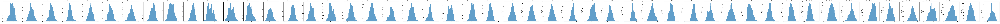

Average Reconstruction Error: 0.1394


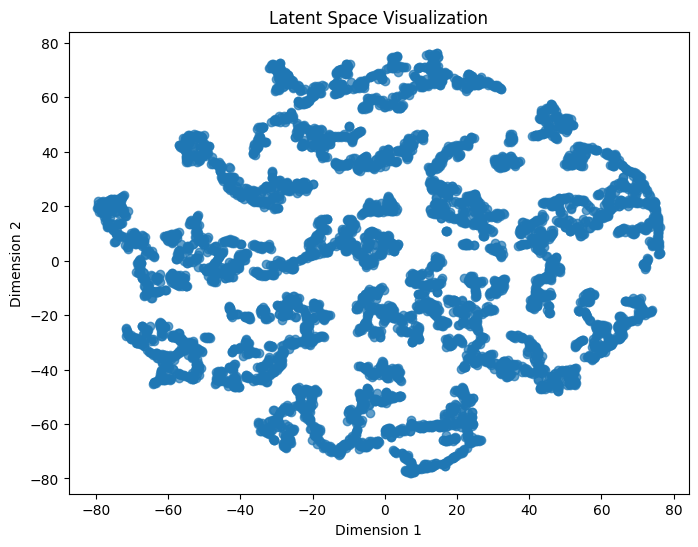

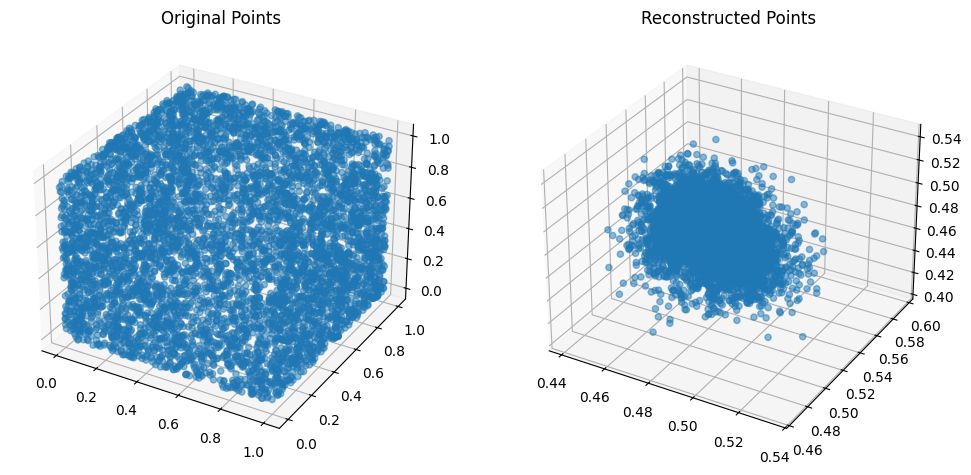

Training VAE with latent_dim=50 and SNR=10
Epoch [1/20], Loss: 0.1350, MSE Loss: 0.1349, KL Loss: 0.0016
Epoch [2/20], Loss: 0.1326, MSE Loss: 0.1326, KL Loss: 0.0006
Epoch [3/20], Loss: 0.1354, MSE Loss: 0.1353, KL Loss: 0.0004
Epoch [4/20], Loss: 0.1248, MSE Loss: 0.1248, KL Loss: 0.0004
Epoch [5/20], Loss: 0.1548, MSE Loss: 0.1548, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1317, MSE Loss: 0.1317, KL Loss: 0.0003
Epoch [7/20], Loss: 0.1524, MSE Loss: 0.1524, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1397, MSE Loss: 0.1397, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1218, MSE Loss: 0.1218, KL Loss: 0.0001
Epoch [10/20], Loss: 0.1377, MSE Loss: 0.1377, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1538, MSE Loss: 0.1537, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1264, MSE Loss: 0.1264, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1440, MSE Loss: 0.1440, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1371, MSE Loss: 0.1371, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1321, MSE Loss: 0.1321, KL Loss: 0.0001
Epoch [16/20], Loss: 

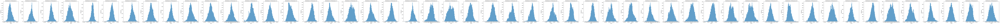

Average Reconstruction Error: 0.1394


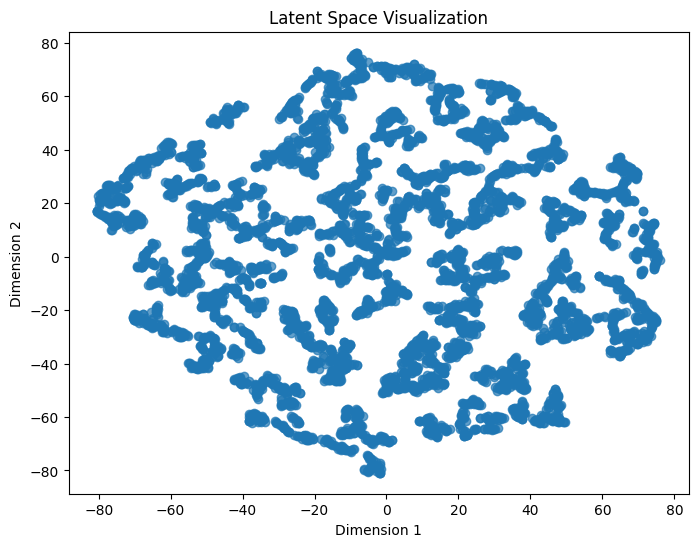

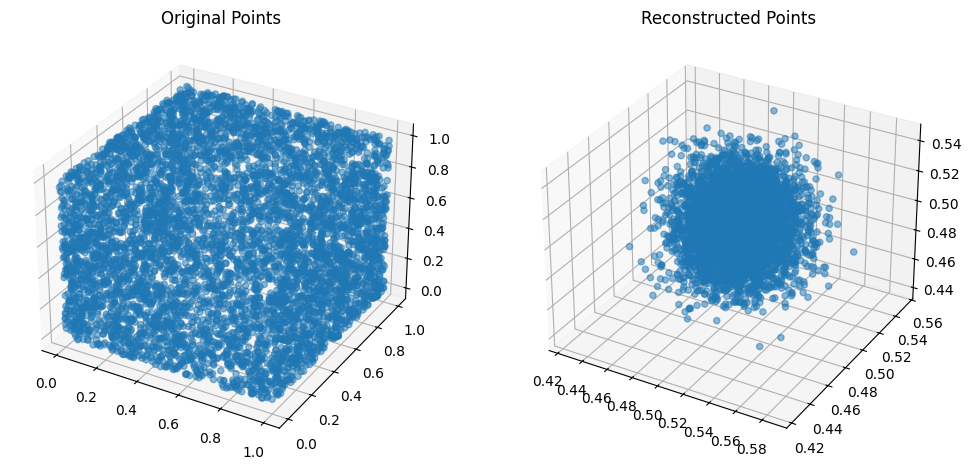

Training VAE with latent_dim=50 and SNR=15
Epoch [1/20], Loss: 0.1268, MSE Loss: 0.1265, KL Loss: 0.0026
Epoch [2/20], Loss: 0.1466, MSE Loss: 0.1465, KL Loss: 0.0010
Epoch [3/20], Loss: 0.1297, MSE Loss: 0.1296, KL Loss: 0.0008
Epoch [4/20], Loss: 0.1404, MSE Loss: 0.1404, KL Loss: 0.0006
Epoch [5/20], Loss: 0.1437, MSE Loss: 0.1437, KL Loss: 0.0004
Epoch [6/20], Loss: 0.1387, MSE Loss: 0.1387, KL Loss: 0.0004
Epoch [7/20], Loss: 0.1388, MSE Loss: 0.1388, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1322, MSE Loss: 0.1322, KL Loss: 0.0003
Epoch [9/20], Loss: 0.1350, MSE Loss: 0.1349, KL Loss: 0.0003
Epoch [10/20], Loss: 0.1331, MSE Loss: 0.1331, KL Loss: 0.0003
Epoch [11/20], Loss: 0.1509, MSE Loss: 0.1508, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1387, MSE Loss: 0.1387, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1419, MSE Loss: 0.1419, KL Loss: 0.0002
Epoch [14/20], Loss: 0.1347, MSE Loss: 0.1347, KL Loss: 0.0002
Epoch [15/20], Loss: 0.1398, MSE Loss: 0.1398, KL Loss: 0.0001
Epoch [16/20], Loss: 

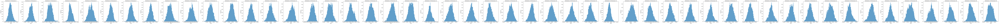

Average Reconstruction Error: 0.1392


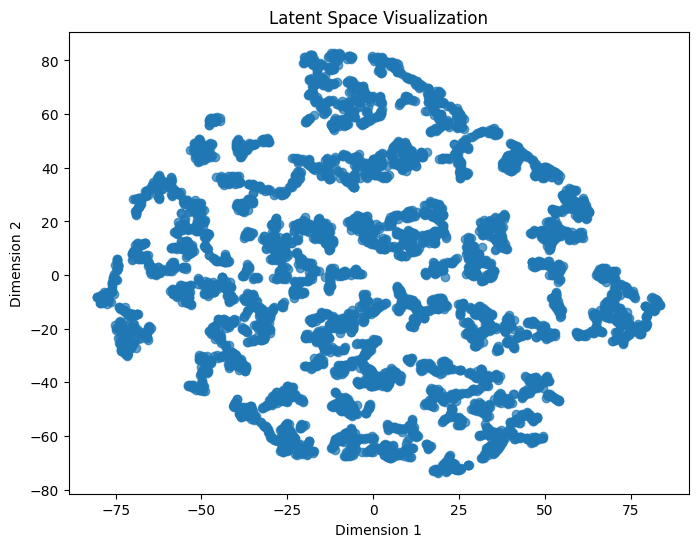

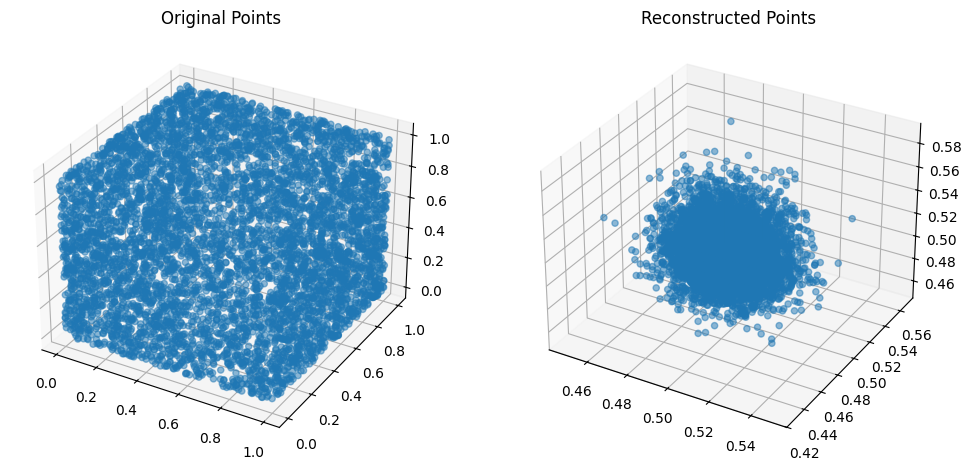

Training VAE with latent_dim=50 and SNR=20
Epoch [1/20], Loss: 0.1344, MSE Loss: 0.1341, KL Loss: 0.0027
Epoch [2/20], Loss: 0.1414, MSE Loss: 0.1413, KL Loss: 0.0011
Epoch [3/20], Loss: 0.1520, MSE Loss: 0.1520, KL Loss: 0.0006
Epoch [4/20], Loss: 0.1314, MSE Loss: 0.1314, KL Loss: 0.0005
Epoch [5/20], Loss: 0.1367, MSE Loss: 0.1366, KL Loss: 0.0005
Epoch [6/20], Loss: 0.1448, MSE Loss: 0.1448, KL Loss: 0.0004
Epoch [7/20], Loss: 0.1332, MSE Loss: 0.1331, KL Loss: 0.0003
Epoch [8/20], Loss: 0.1509, MSE Loss: 0.1509, KL Loss: 0.0003
Epoch [9/20], Loss: 0.1411, MSE Loss: 0.1411, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1391, MSE Loss: 0.1390, KL Loss: 0.0002
Epoch [11/20], Loss: 0.1279, MSE Loss: 0.1279, KL Loss: 0.0002
Epoch [12/20], Loss: 0.1491, MSE Loss: 0.1490, KL Loss: 0.0002
Epoch [13/20], Loss: 0.1254, MSE Loss: 0.1254, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1305, MSE Loss: 0.1305, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1389, MSE Loss: 0.1389, KL Loss: 0.0001
Epoch [16/20], Loss: 

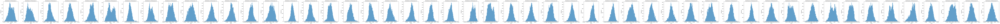

Average Reconstruction Error: 0.1393


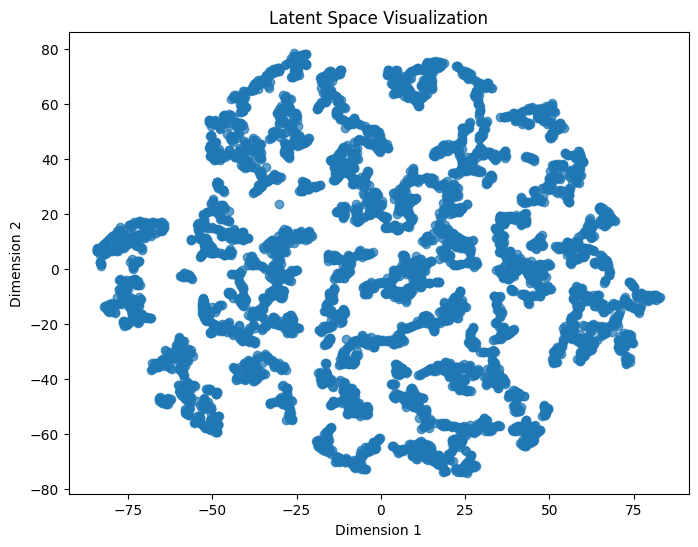

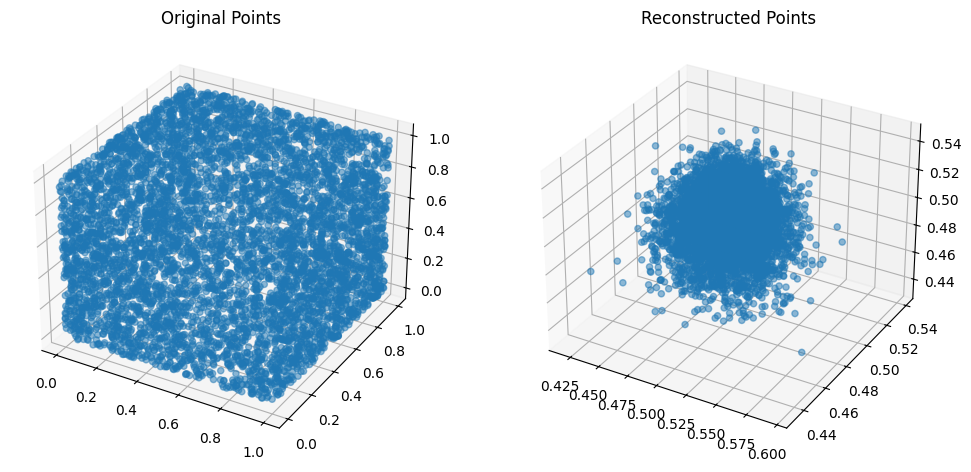

Training VAE with latent_dim=50 and SNR=30
Epoch [1/20], Loss: 0.1470, MSE Loss: 0.1467, KL Loss: 0.0021
Epoch [2/20], Loss: 0.1380, MSE Loss: 0.1379, KL Loss: 0.0009
Epoch [3/20], Loss: 0.1451, MSE Loss: 0.1450, KL Loss: 0.0005
Epoch [4/20], Loss: 0.1355, MSE Loss: 0.1355, KL Loss: 0.0003
Epoch [5/20], Loss: 0.1372, MSE Loss: 0.1372, KL Loss: 0.0002
Epoch [6/20], Loss: 0.1330, MSE Loss: 0.1330, KL Loss: 0.0002
Epoch [7/20], Loss: 0.1394, MSE Loss: 0.1394, KL Loss: 0.0002
Epoch [8/20], Loss: 0.1318, MSE Loss: 0.1317, KL Loss: 0.0001
Epoch [9/20], Loss: 0.1589, MSE Loss: 0.1588, KL Loss: 0.0002
Epoch [10/20], Loss: 0.1411, MSE Loss: 0.1411, KL Loss: 0.0001
Epoch [11/20], Loss: 0.1397, MSE Loss: 0.1397, KL Loss: 0.0001
Epoch [12/20], Loss: 0.1428, MSE Loss: 0.1428, KL Loss: 0.0001
Epoch [13/20], Loss: 0.1534, MSE Loss: 0.1534, KL Loss: 0.0001
Epoch [14/20], Loss: 0.1448, MSE Loss: 0.1448, KL Loss: 0.0001
Epoch [15/20], Loss: 0.1292, MSE Loss: 0.1292, KL Loss: 0.0001
Epoch [16/20], Loss: 

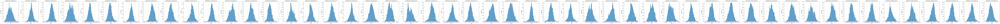

Average Reconstruction Error: 0.1394


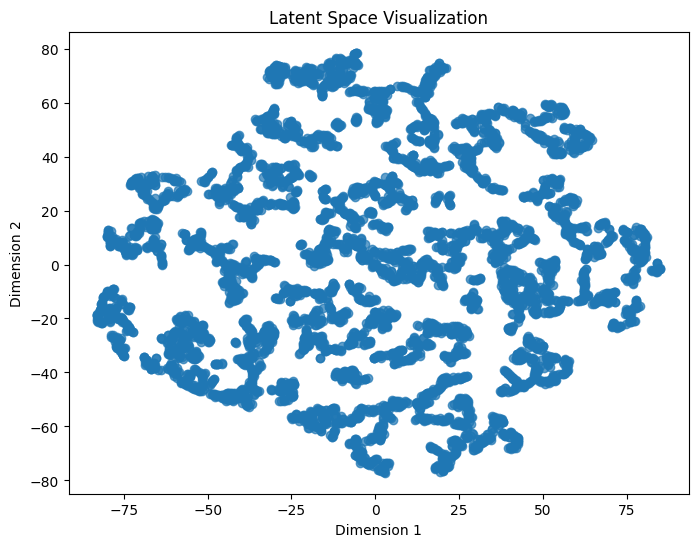

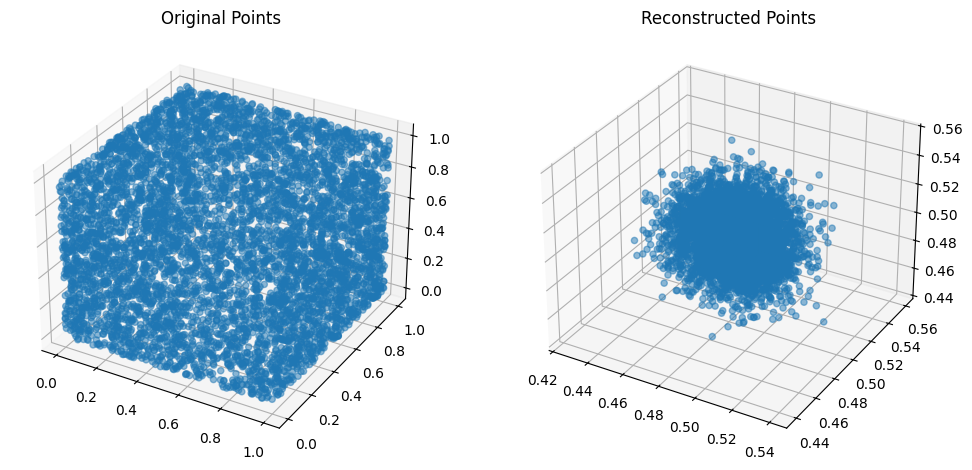

In [104]:
latent_dims = [3, 5, 10, 20, 50]
snrs = [5, 10, 15, 20, 30]

def reconstruct_data(model, data_loader):
    model.to(device)
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for data in data_loader:
            inputs = data[0].to(next(model.parameters()).device)
            recon_model = model(inputs)[0].cpu().numpy()
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(*recon_model.T, s=1)
            plt.show()

for latent_dim in latent_dims:
    for snr in snrs:
        print(f'Training VAE with latent_dim={latent_dim} and SNR={snr}')
        model = VAE(input_dim=3, latent_dim=latent_dim, snr=snr)
        train_vae(model, loader, num_epochs=20, kl_weight=0.1)
        estimate_information(model, loader)

In [106]:
latent_dims = [100]
snrs = [50]

def reconstruct_data(model, data_loader):
    model.to(device)
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        for data in data_loader:
            inputs = data[0].to(next(model.parameters()).device)
            recon_model = model(inputs)[0].cpu().numpy()
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(*recon_model.T, s=1)
            plt.show()

for latent_dim in latent_dims:
    for snr in snrs:
        print(f'Training VAE with latent_dim={latent_dim} and SNR={snr}')
        model = VAE(input_dim=3, latent_dim=latent_dim, snr=snr)
        train_vae(model, loader, num_epochs=20, kl_weight=0.1)
        estimate_information(model, loader)

Training VAE with latent_dim=200 and SNR=50
Epoch [1/20], Loss: 0.1496, MSE Loss: 0.1490, KL Loss: 0.0060
Epoch [2/20], Loss: 0.1289, MSE Loss: 0.1286, KL Loss: 0.0027
Epoch [3/20], Loss: 0.1533, MSE Loss: 0.1531, KL Loss: 0.0021
Epoch [4/20], Loss: 0.1615, MSE Loss: 0.1613, KL Loss: 0.0015
Epoch [5/20], Loss: 0.1301, MSE Loss: 0.1300, KL Loss: 0.0011
Epoch [6/20], Loss: 0.1573, MSE Loss: 0.1572, KL Loss: 0.0011
Epoch [7/20], Loss: 0.1430, MSE Loss: 0.1429, KL Loss: 0.0012
Epoch [8/20], Loss: 0.1464, MSE Loss: 0.1463, KL Loss: 0.0008
Epoch [9/20], Loss: 0.1365, MSE Loss: 0.1365, KL Loss: 0.0007
Epoch [10/20], Loss: 0.1286, MSE Loss: 0.1286, KL Loss: 0.0007
Epoch [11/20], Loss: 0.1337, MSE Loss: 0.1336, KL Loss: 0.0006
Epoch [12/20], Loss: 0.1578, MSE Loss: 0.1578, KL Loss: 0.0006
Epoch [13/20], Loss: 0.1422, MSE Loss: 0.1422, KL Loss: 0.0005
Epoch [14/20], Loss: 0.1346, MSE Loss: 0.1345, KL Loss: 0.0005
Epoch [15/20], Loss: 0.1567, MSE Loss: 0.1567, KL Loss: 0.0004
Epoch [16/20], Loss:

ValueError: Image size of 80000x500 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive at 0x0000016645E6D440> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 80000x500 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 80000x500 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 80000x500 with 200 Axes>